# Data Exploration

In [1]:
!pip install --upgrade libpysal esda

import pandas as pd
import numpy as np 
import re
from datetime import datetime 
import ast
from collections import Counter
from collections import OrderedDict
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

# Install external packages separately through the command line or using !pip in Jupyter
# Example:
!pip install urbanaccess
!pip install pandana

#insert file_path for the data
file_path = 'C:/Users/anton/Documents/2de_master/Thesis/Code/analysis/Code/Airbnb_Spatiotemporal_Analysis/Rome Airbnb_Spatiotemporal_Analysis/Baseline models/Combined_data_rome.csv'
#read data, and quickly check if it is correctly read in
dataframe1= pd.read_csv(file_path)

In [2]:
dataframe1['date'] = pd.to_datetime(dataframe1['date'])

In [3]:
dataframe1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47409 entries, 0 to 47408
Columns: 126 entries, id to kitchen_amenities
dtypes: bool(96), datetime64[ns](1), float64(10), int64(19)
memory usage: 15.2 MB


## Checking the distributions of the review ratings columns

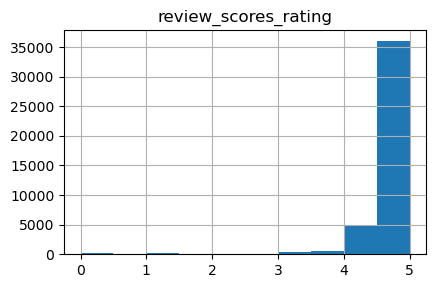

In [4]:
# Checking the distributions of the review ratings columns
# Filter the dataframe to only include rows where 'listing_reviewed' is True
filtered_dataframe = dataframe1[dataframe1['listing_reviewed'] == True]

# Get the list of columns that start with 'review_scores'
variables_to_plot = list(filtered_dataframe.columns[filtered_dataframe.columns.str.startswith("review_scores") == True])

# Create a figure for the plots
fig = plt.figure(figsize=(12,8))

# Plot the histograms for each 'review_scores' column
for i, var_name in enumerate(variables_to_plot):
    ax = fig.add_subplot(3, 3, i + 1)
    filtered_dataframe[var_name].hist(bins=10, ax=ax)
    ax.set_title(var_name)

# Adjust the layout and display the plot
fig.tight_layout()
plt.show()

## Neighborhood Analysis

In [5]:
import geopandas as gpd
# Importing the Paris neighbourhood  GeoJSON file as a dataframe in geopandas
map_dataframe1 = gpd.read_file('C:/Users/anton/Documents/2de_master/Thesis/Data/2. airbnb_data/Rome/Q1 airbnb_data Rome/neighbourhoods.geojson')
map_dataframe1.drop('neighbourhood_group', axis = 1, inplace = True)
map_dataframe1.head(20)

,neighbourhood,geometry
0,I Centro Storico,"MULTIPOLYGON (((12.44396 41.93390, 12.44472 41..."
1,III Monte Sacro,"MULTIPOLYGON (((12.56321 42.07464, 12.56269 42..."
2,IV Tiburtina,"MULTIPOLYGON (((12.63542 41.95729, 12.63696 41..."
3,VI Roma delle Torri,"MULTIPOLYGON (((12.70671 41.93375, 12.70691 41..."
4,VII San Giovanni/Cinecittà,"MULTIPOLYGON (((12.51668 41.89194, 12.52266 41..."
5,VIII Appia Antica,"MULTIPOLYGON (((12.48108 41.87642, 12.48137 41..."
6,IX Eur,"MULTIPOLYGON (((12.47554 41.84734, 12.47616 41..."
7,X Ostia/Acilia,"MULTIPOLYGON (((12.35255 41.80295, 12.35351 41..."
8,XI Arvalia/Portuense,"MULTIPOLYGON (((12.28997 41.82954, 12.28645 41..."
9,XII Monte Verde,"MULTIPOLYGON (((12.25065 41.87581, 12.24905 41..."


In [6]:
# Get all columns that start with 'neighbourhood'
neighbourhood_columns = [col for col in dataframe1.columns if col.startswith('neighbourhood')]

# Print the list of columns
print(neighbourhood_columns)

['neighbourhood_I Centro Storico', 'neighbourhood_II Parioli/Nomentano', 'neighbourhood_III Monte Sacro', 'neighbourhood_IV Tiburtina', 'neighbourhood_IX Eur', 'neighbourhood_V Prenestino/Centocelle', 'neighbourhood_VI Roma delle Torri', 'neighbourhood_VII San Giovanni/Cinecittà', 'neighbourhood_VIII Appia Antica', 'neighbourhood_X Ostia/Acilia', 'neighbourhood_XI Arvalia/Portuense', 'neighbourhood_XII Monte Verde', 'neighbourhood_XIII Aurelia', 'neighbourhood_XIV Monte Mario', 'neighbourhood_XV Cassia/Flaminia']


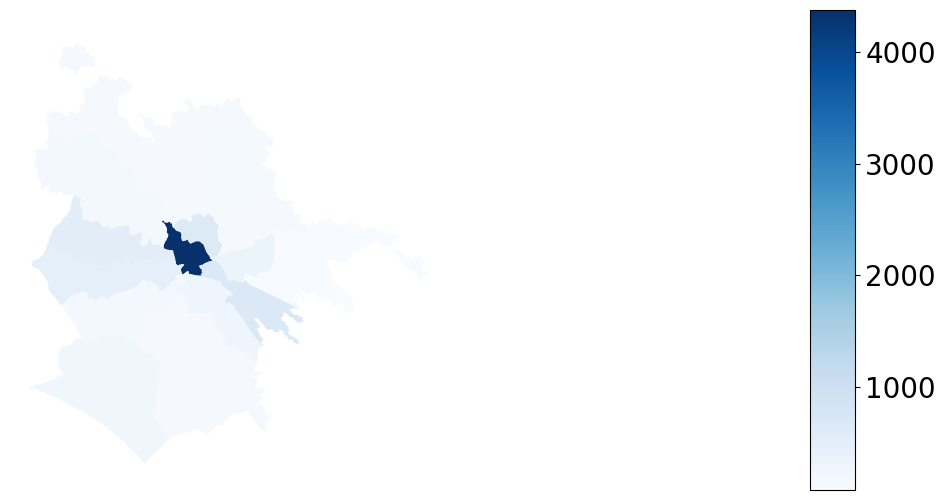

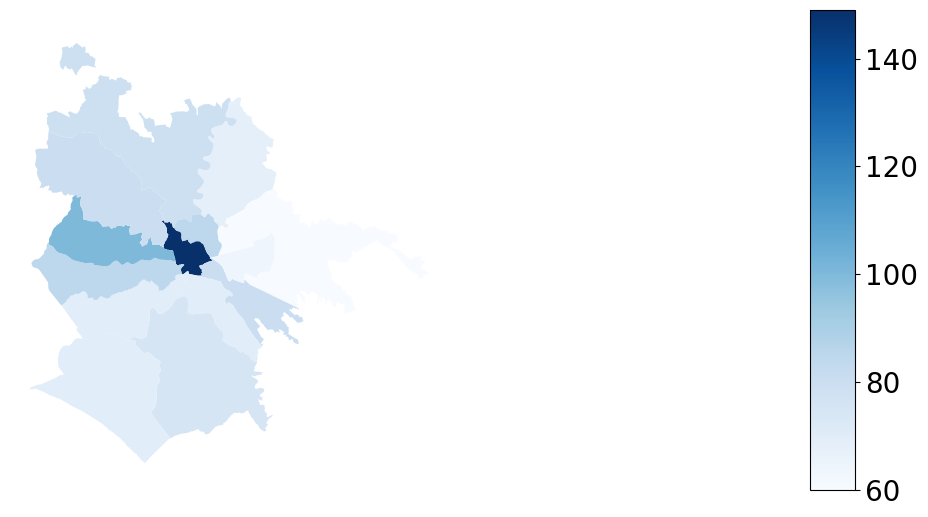

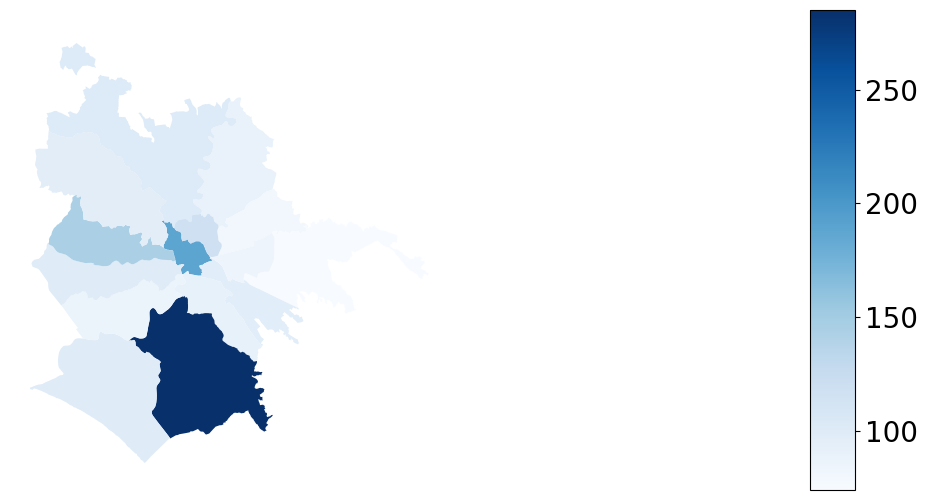

                 neighbourhood  number_of_listings  median_price  mean_price
0             I Centro Storico                4380         149.0  188.184166
1         II Parioli/Nomentano                 651          85.0  118.049847
2              III Monte Sacro                 153          68.5   88.888361
3                 IV Tiburtina                 138          60.0   79.687582
4                       IX Eur                 130          75.0  285.058577
5      V Prenestino/Centocelle                 342          64.0   84.830508
6          VI Roma delle Torri                  77          60.0   73.877934
7   VII San Giovanni/Cinecittà                 693          80.0   97.508222
8            VIII Appia Antica                 276          70.0   90.732809
9               X Ostia/Acilia                 249          70.0   99.716461
10        XI Arvalia/Portuense                 168          70.0   86.775641
11             XII Monte Verde                 476          85.0  100.148530

In [7]:
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
from matplotlib import cm, colors

# Sample data loading
# dataframe1 = pd.read_csv('path_to_your_data.csv')  # Assuming the dataset is read in as dataframe1

# Define the list of neighborhood columns
neighbourhood_cols = ['neighbourhood_I Centro Storico', 'neighbourhood_II Parioli/Nomentano', 
                      'neighbourhood_III Monte Sacro', 'neighbourhood_IV Tiburtina', 'neighbourhood_IX Eur', 
                      'neighbourhood_V Prenestino/Centocelle', 'neighbourhood_VI Roma delle Torri', 
                      'neighbourhood_VII San Giovanni/Cinecittà', 'neighbourhood_VIII Appia Antica', 
                      'neighbourhood_X Ostia/Acilia', 'neighbourhood_XI Arvalia/Portuense', 
                      'neighbourhood_XII Monte Verde', 'neighbourhood_XIII Aurelia', 'neighbourhood_XIV Monte Mario', 
                      'neighbourhood_XV Cassia/Flaminia']

# Identify the neighborhood using idxmax to find the first True value
dataframe1['neighbourhood'] = dataframe1[neighbourhood_cols].idxmax(axis=1)
dataframe1['neighbourhood'] = dataframe1['neighbourhood'].apply(lambda x: x.split('_')[1] if pd.notnull(x) else None)

# Step 1: Keep only the row with the latest date for each ID for the count of unique IDs
latest_entries = dataframe1.sort_values('date').groupby('id').tail(1)

# Count of unique IDs per neighbourhood
unique_id_counts = latest_entries.groupby('neighbourhood')['id'].nunique().reset_index()
unique_id_counts.rename(columns={'id': 'number_of_listings'}, inplace=True)

# Aggregating price data across all rows
price_stats = dataframe1.groupby('neighbourhood').agg(
    median_price=('price', 'median'),
    mean_price=('price', 'mean')
).reset_index()

# Merge the counts of unique IDs with the price statistics
neighbourhood_stats = pd.merge(unique_id_counts, price_stats, on='neighbourhood')

# Assuming 'map_dataframe1' is already defined somewhere in your code
# Putting the dataframes together
neighbourhood_map_dataframe1 = map_dataframe1.set_index('neighbourhood').join(neighbourhood_stats.set_index('neighbourhood'))

# Plotting function to reduce code redundancy
def plot_neighbourhood_data(column, fontsize=20):
    fig, ax = plt.subplots(1, figsize=(15, 6))
    neighbourhood_map_dataframe1.plot(column=column, cmap='Blues', ax=ax, rasterized=True)
    ax.axis('off')
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=neighbourhood_map_dataframe1[column].min(), vmax=neighbourhood_map_dataframe1[column].max()))
    sm._A = []  # Providing an empty array for the data range
    cbar = fig.colorbar(sm, cax=cax)
    cbar.ax.tick_params(labelsize=fontsize)  # Set the font size for the color bar ticks
    plt.show()

# Plotting the number of listings, median price, and mean price in each neighbourhood
plot_neighbourhood_data('number_of_listings', fontsize=20)
plot_neighbourhood_data('median_price', fontsize=20)
plot_neighbourhood_data('mean_price', fontsize=20)

print(neighbourhood_stats)

## Amenities analysis

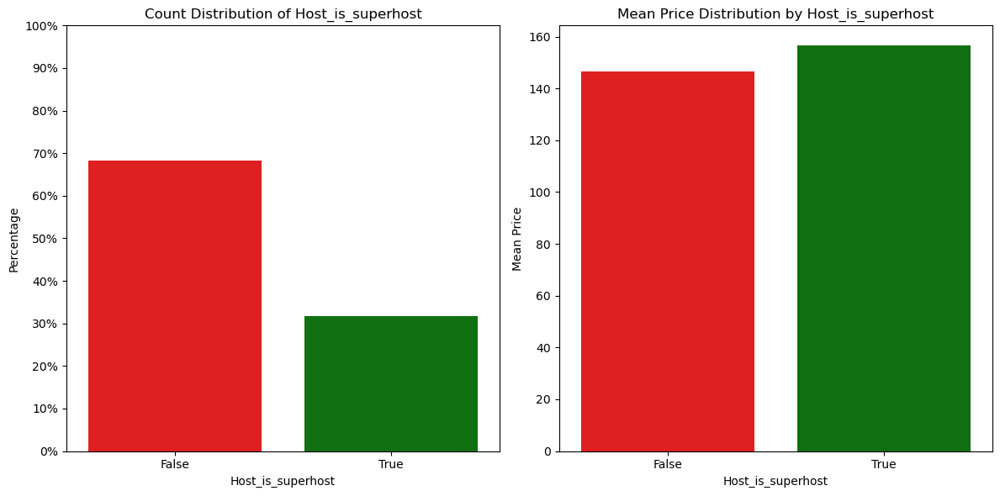

% Wise Split of Host_is_superhost:
host_is_superhost
False    68.265519
True     31.734481
Name: proportion, dtype: float64

P-value for Host_is_superhost: 2.679899601596156e-07
Host_is_superhost is statistically significant (p-value < 0.05)
host_is_superhost
False    0.682655
True     0.317345
Name: proportion, dtype: float64


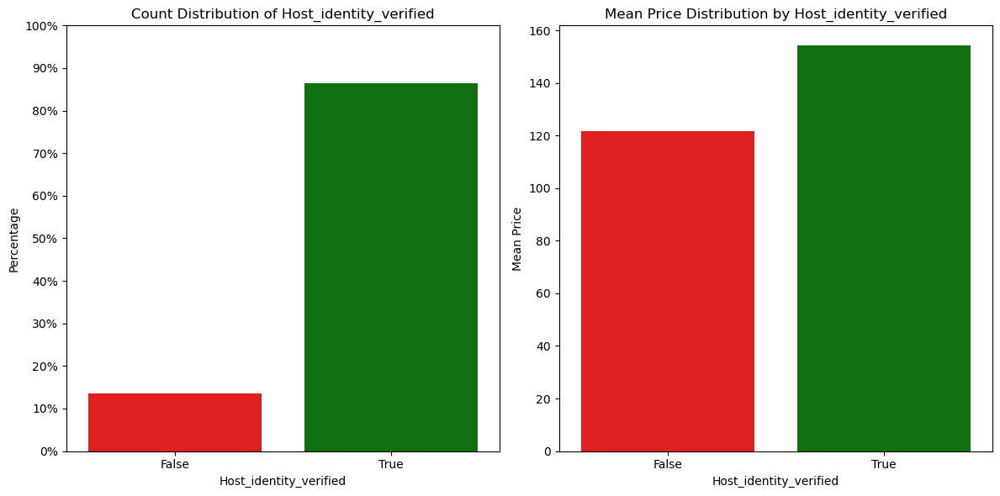

% Wise Split of Host_identity_verified:
host_identity_verified
True     86.411863
False    13.588137
Name: proportion, dtype: float64

P-value for Host_identity_verified: 1.561644041957879e-62
Host_identity_verified is statistically significant (p-value < 0.05)
host_identity_verified
True     0.864119
False    0.135881
Name: proportion, dtype: float64


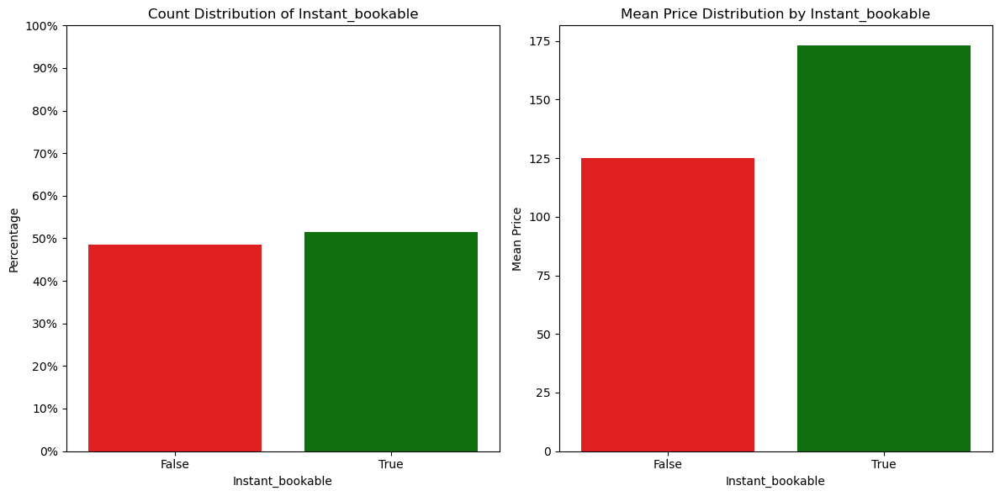

% Wise Split of Instant_bookable:
instant_bookable
True     51.431163
False    48.568837
Name: proportion, dtype: float64

P-value for Instant_bookable: 1.1841080327919255e-153
Instant_bookable is statistically significant (p-value < 0.05)
instant_bookable
True     0.514312
False    0.485688
Name: proportion, dtype: float64


In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind

def binary_count_and_price_plot(column_name, alpha=0.05):
    # Define colors for True and False values
    colors = {True: 'green', False: 'red'}

    # Plot count distribution
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    countplot_ax = sns.countplot(x=column_name, data=dataframe1, palette=colors)
    plt.title(f'Count Distribution of {column_name.capitalize()}')
    plt.ylabel('Percentage')
    plt.xlabel(column_name.capitalize())

    # Calculate total count and set y-ticks to clean percentage intervals
    total_count = len(dataframe1)
    y_tick_interval = 10  # Set the interval to 10%
    y_ticks = range(0, total_count + 1, int(total_count * y_tick_interval / 100))
    y_tick_labels = [f'{y_tick_interval * i}%' for i in range(len(y_ticks))]
    countplot_ax.set_yticks(y_ticks)
    countplot_ax.set_yticklabels(y_tick_labels)

    # Plot mean price distribution
    plt.subplot(1, 2, 2)
    mean_prices = dataframe1.groupby(column_name)['price'].mean()
    sns.barplot(x=mean_prices.index, y=mean_prices.values, palette=colors)
    plt.title(f'Mean Price Distribution by {column_name.capitalize()}')
    plt.ylabel('Mean Price')
    plt.xlabel(column_name.capitalize())
    plt.tight_layout()
    plt.show()

    # Calculate t-test for median prices
    true_prices = dataframe1[dataframe1[column_name] == True]['price']
    false_prices = dataframe1[dataframe1[column_name] == False]['price']
    t_stat, p_value = ttest_ind(true_prices, false_prices, equal_var=False)  # assuming unequal variances
   
    # Display additional information
    percent_split = dataframe1[column_name].value_counts(normalize=True) * 100
    print(f'% Wise Split of {column_name.capitalize()}:\n{percent_split}')
    
    print(f'\nP-value for {column_name.capitalize()}: {p_value}')
    
    # Check if p-value is greater than or equal to alpha
    if p_value >= alpha:
        print(f"{column_name.capitalize()} is not statistically significant (p-value >= {alpha})")
        return column_name
    else:
        print(f"{column_name.capitalize()} is statistically significant (p-value < {alpha})")
        return None  # or any other value if needed

superhost = binary_count_and_price_plot('host_is_superhost')
print(dataframe1.host_is_superhost.value_counts(normalize=True))

test2 = binary_count_and_price_plot('host_identity_verified')
print(dataframe1.host_identity_verified.value_counts(normalize=True))

test3 = binary_count_and_price_plot('instant_bookable')
print(dataframe1.instant_bookable.value_counts(normalize=True))

In [9]:
# Get column names and their indices
column_info = list(enumerate(dataframe1.columns))
# Print column names and their indices
for index, column_name in column_info:
    print(f"Column {index}: {column_name}")
    
#now we know that the amenity columns start from index 51

Column 0: id
Column 1: date
Column 2: available
Column 3: price
Column 4: season_Autumn
Column 5: is_holiday
Column 6: is_school_holiday
Column 7: host_id
Column 8: host_response_time
Column 9: host_is_superhost
Column 10: host_listings_count
Column 11: host_total_listings_count
Column 12: host_identity_verified
Column 13: latitude
Column 14: longitude
Column 15: accommodates
Column 16: bathrooms
Column 17: bedrooms
Column 18: beds
Column 19: availability_90
Column 20: availability_365
Column 21: number_of_reviews
Column 22: number_of_reviews_ltm
Column 23: number_of_reviews_l30d
Column 24: review_scores_rating
Column 25: instant_bookable
Column 26: calculated_host_listings_count
Column 27: calculated_host_listings_count_entire_homes
Column 28: calculated_host_listings_count_private_rooms
Column 29: reviews_per_month
Column 30: Bidet
Column 31: game console
Column 32: sound system
Column 33: Books and reading material
Column 34: toys children
Column 35: Host greets you
Column 36: crib


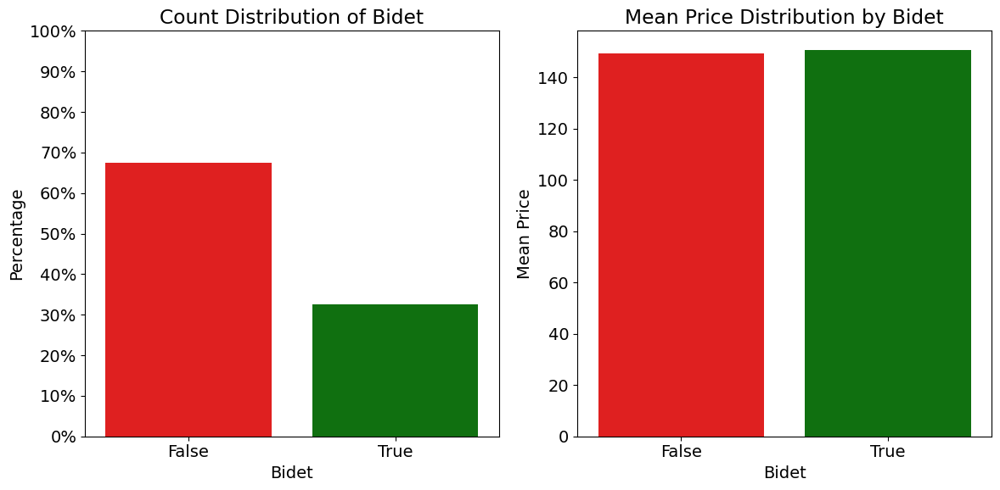

% Wise Split of Bidet:
Bidet
False    67.358518
True     32.641482
Name: proportion, dtype: float64

P-value for Bidet: 0.43017118448714664
Bidet is not statistically significant (p-value >= 0.05)


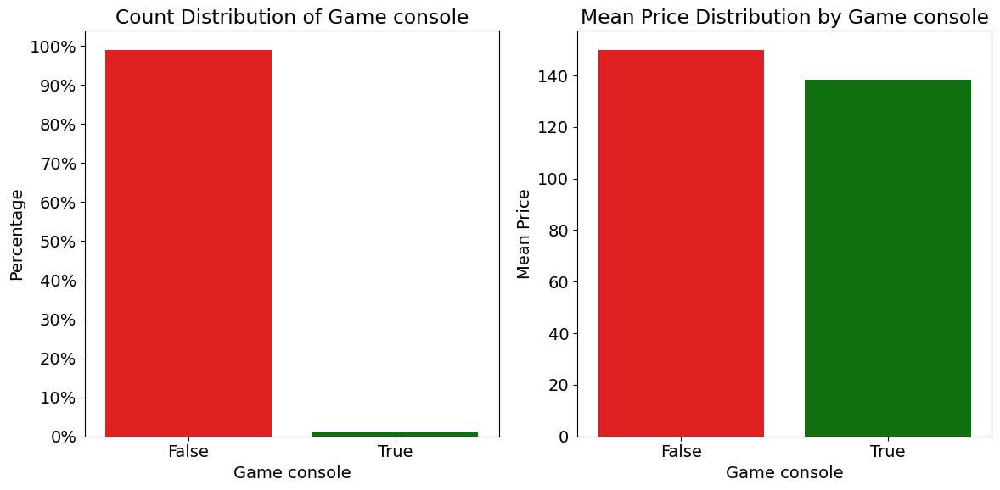

% Wise Split of Game console:
game console
False    98.920036
True      1.079964
Name: proportion, dtype: float64

P-value for Game console: 0.09254496257007416
Game console is not statistically significant (p-value >= 0.05)


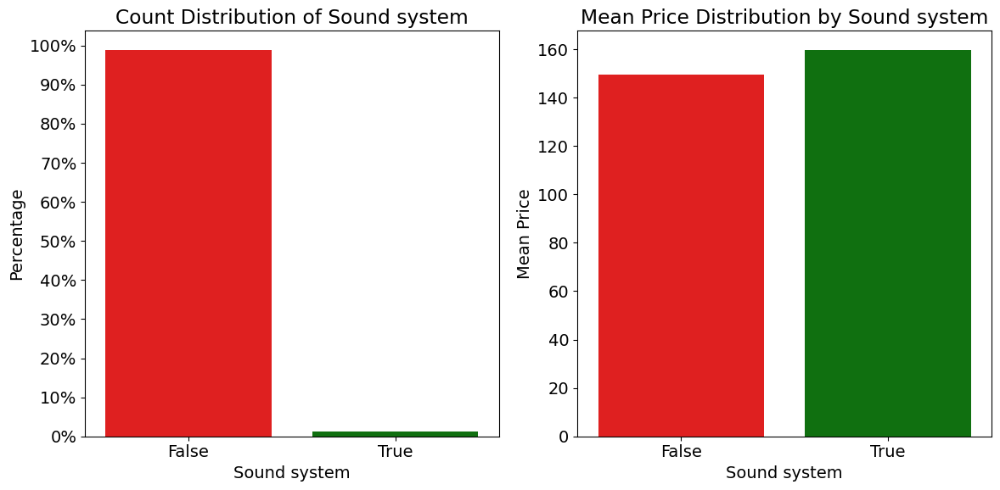

% Wise Split of Sound system:
sound system
False    98.814571
True      1.185429
Name: proportion, dtype: float64

P-value for Sound system: 0.05305316049268124
Sound system is not statistically significant (p-value >= 0.05)


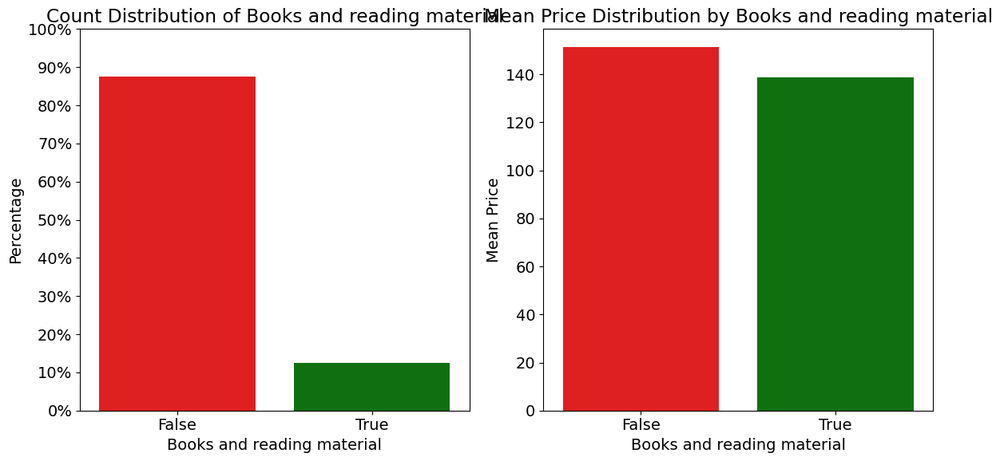

% Wise Split of Books and reading material:
Books and reading material
False    87.512919
True     12.487081
Name: proportion, dtype: float64

P-value for Books and reading material: 9.658755715258629e-08
Books and reading material is statistically significant (p-value < 0.05)


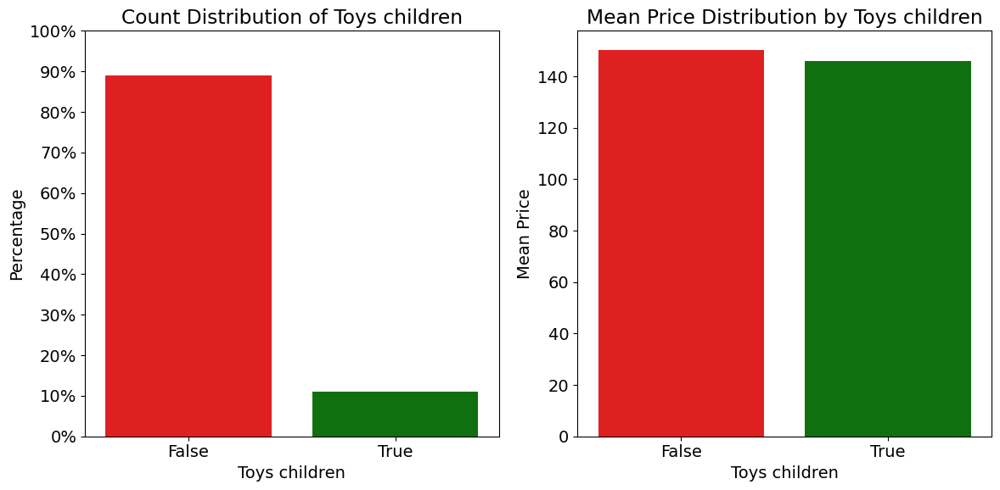

% Wise Split of Toys children:
toys children
False    88.999979
True     11.000021
Name: proportion, dtype: float64

P-value for Toys children: 0.03156174645901578
Toys children is statistically significant (p-value < 0.05)


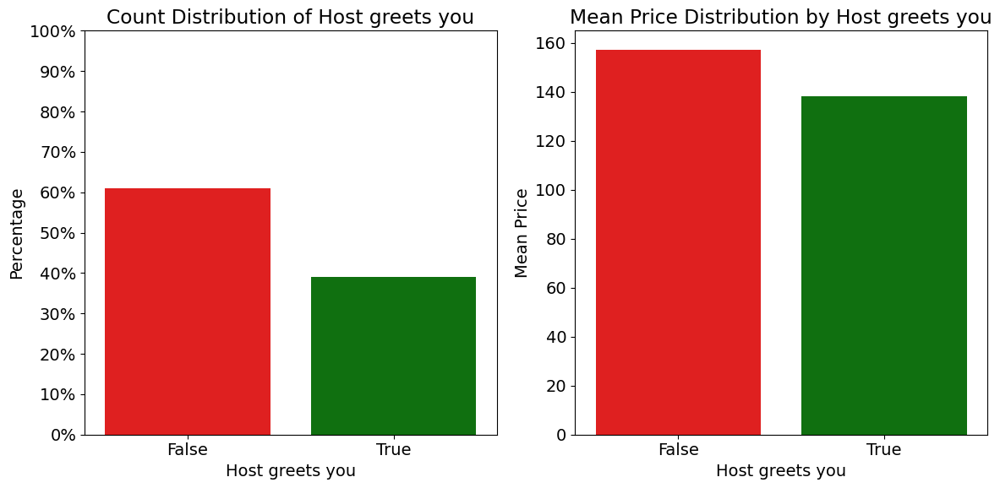

% Wise Split of Host greets you:
Host greets you
False    61.003185
True     38.996815
Name: proportion, dtype: float64

P-value for Host greets you: 3.3708247075317625e-25
Host greets you is statistically significant (p-value < 0.05)


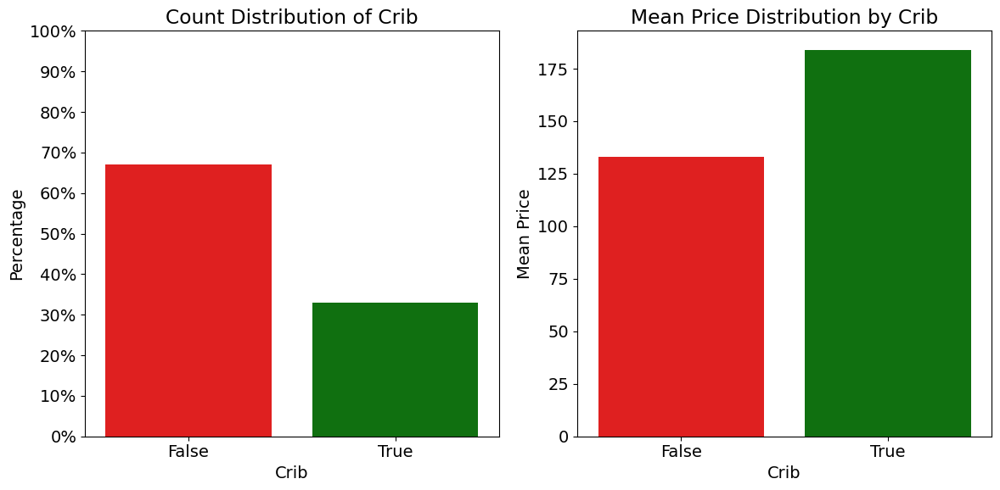

% Wise Split of Crib:
crib
False    67.115948
True     32.884052
Name: proportion, dtype: float64

P-value for Crib: 2.2936746939510176e-130
Crib is statistically significant (p-value < 0.05)


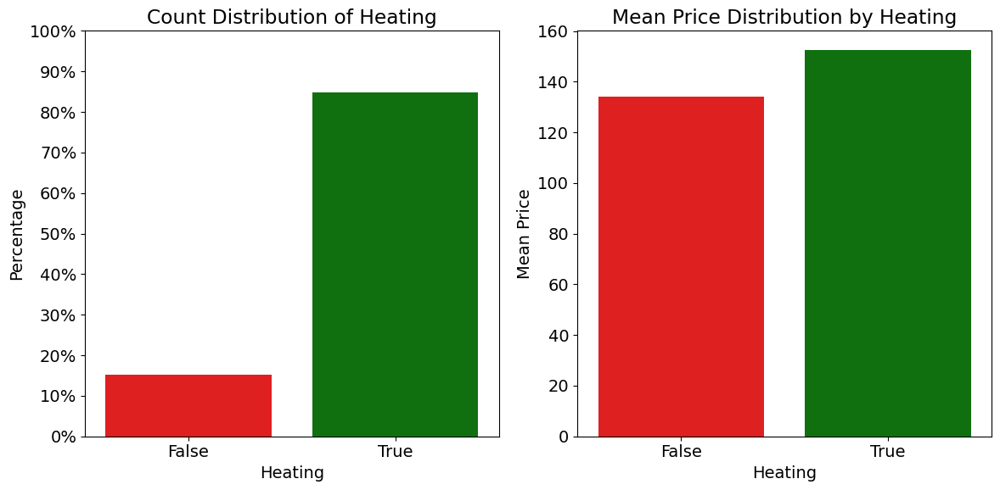

% Wise Split of Heating:
Heating
True     84.745512
False    15.254488
Name: proportion, dtype: float64

P-value for Heating: 1.3707758401820673e-24
Heating is statistically significant (p-value < 0.05)


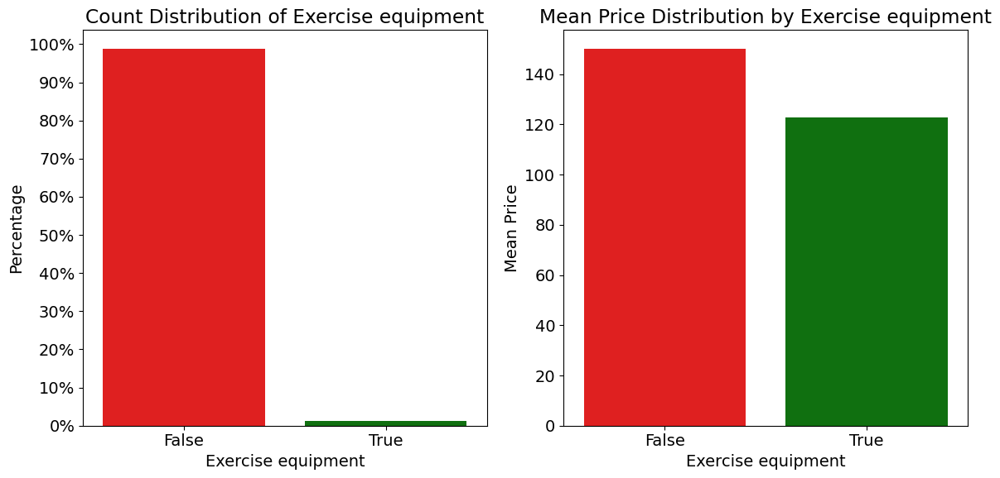

% Wise Split of Exercise equipment:
exercise equipment
False    98.744964
True      1.255036
Name: proportion, dtype: float64

P-value for Exercise equipment: 4.947603150445353e-07
Exercise equipment is statistically significant (p-value < 0.05)


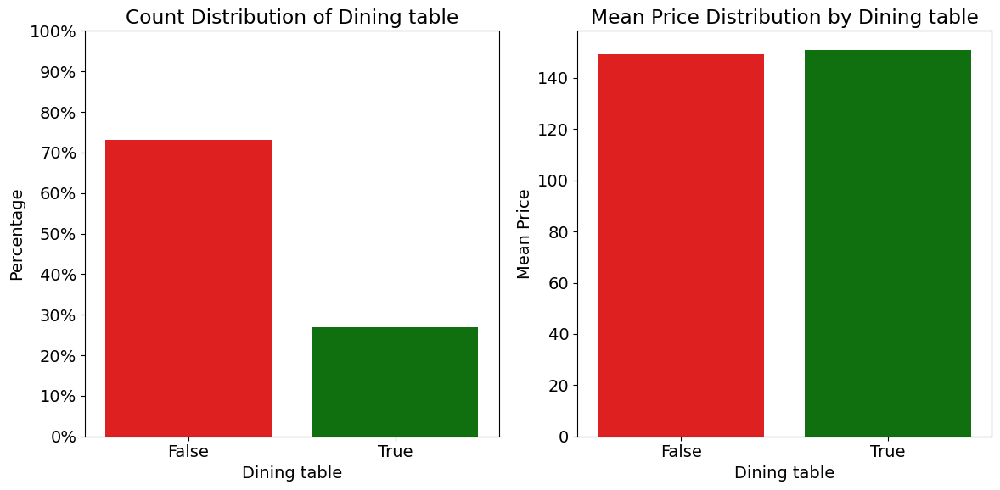

% Wise Split of Dining table:
Dining table
False    73.154886
True     26.845114
Name: proportion, dtype: float64

P-value for Dining table: 0.37215654308351487
Dining table is not statistically significant (p-value >= 0.05)


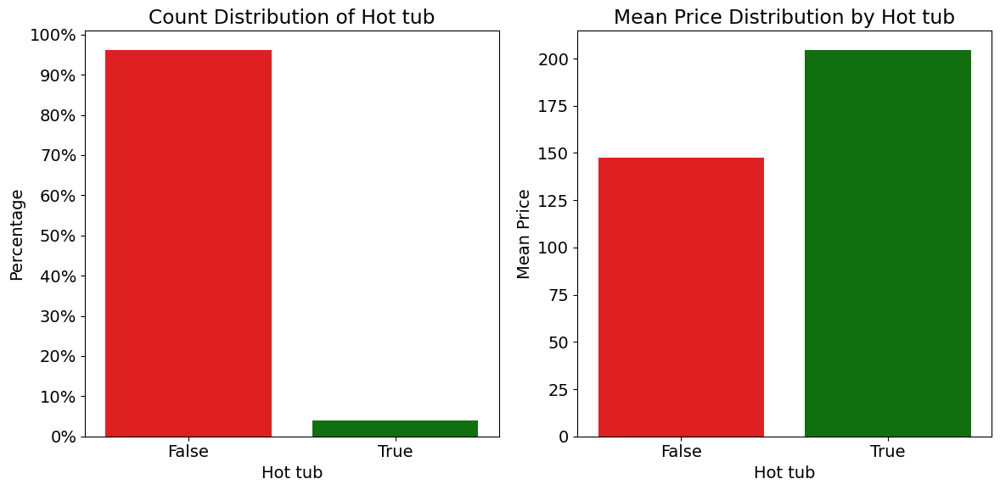

% Wise Split of Hot tub:
hot tub
False    96.123099
True      3.876901
Name: proportion, dtype: float64

P-value for Hot tub: 5.1022810773440983e-14
Hot tub is statistically significant (p-value < 0.05)


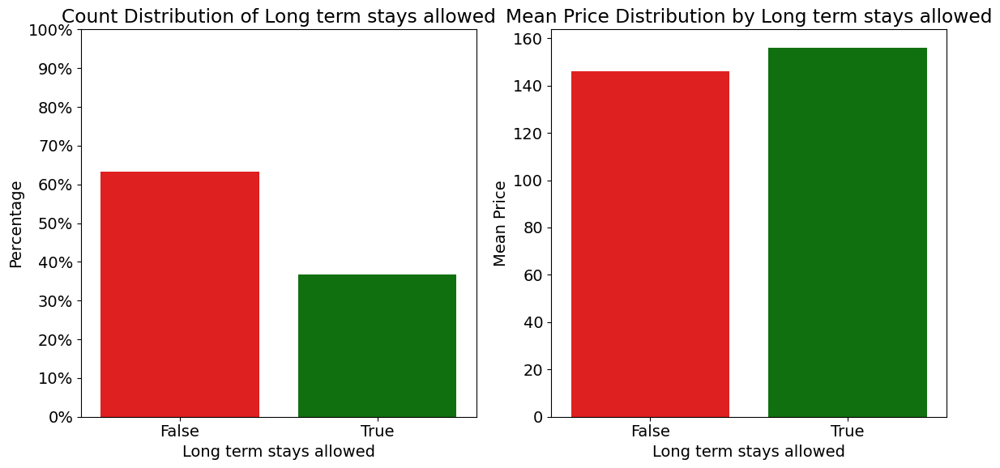

% Wise Split of Long term stays allowed:
Long term stays allowed
False    63.272796
True     36.727204
Name: proportion, dtype: float64

P-value for Long term stays allowed: 1.3871159332388041e-06
Long term stays allowed is statistically significant (p-value < 0.05)


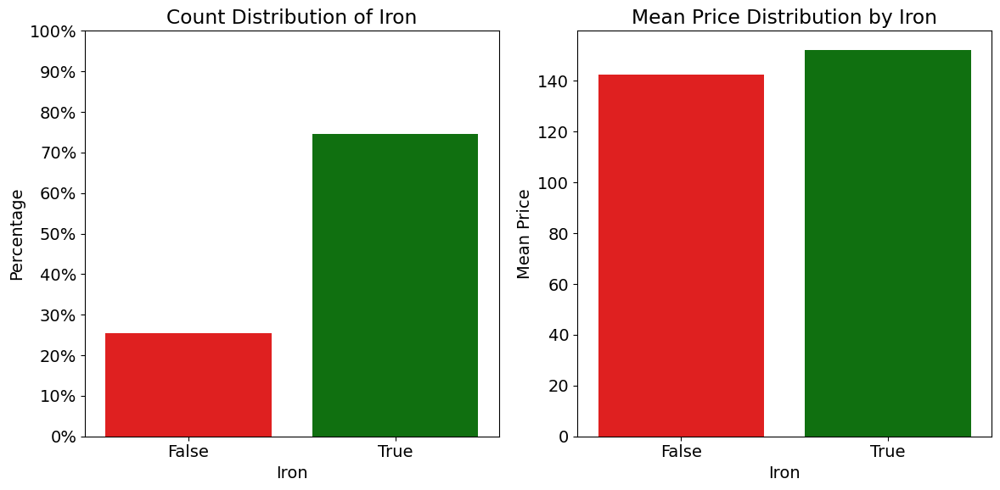

% Wise Split of Iron:
Iron
True     74.654601
False    25.345399
Name: proportion, dtype: float64

P-value for Iron: 3.3404927964284015e-05
Iron is statistically significant (p-value < 0.05)


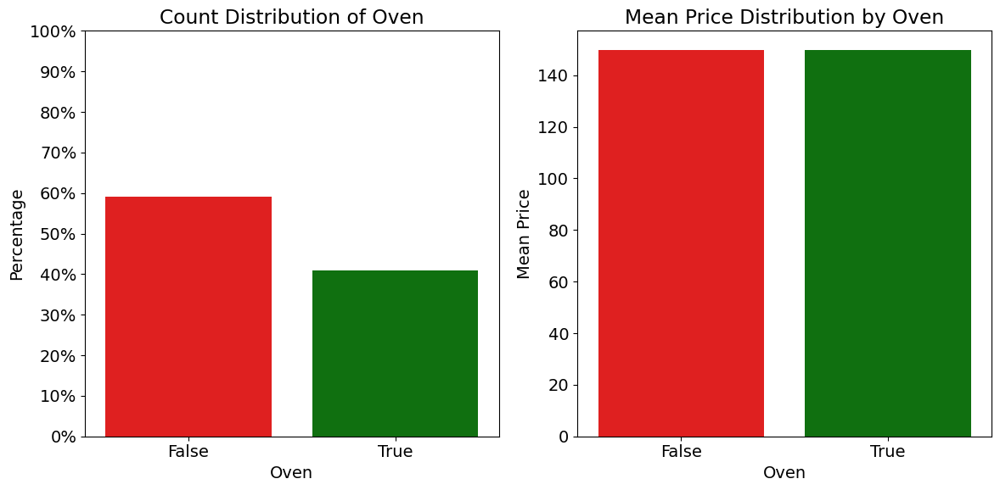

% Wise Split of Oven:
oven
False    59.140669
True     40.859331
Name: proportion, dtype: float64

P-value for Oven: 0.9784887787614674
Oven is not statistically significant (p-value >= 0.05)


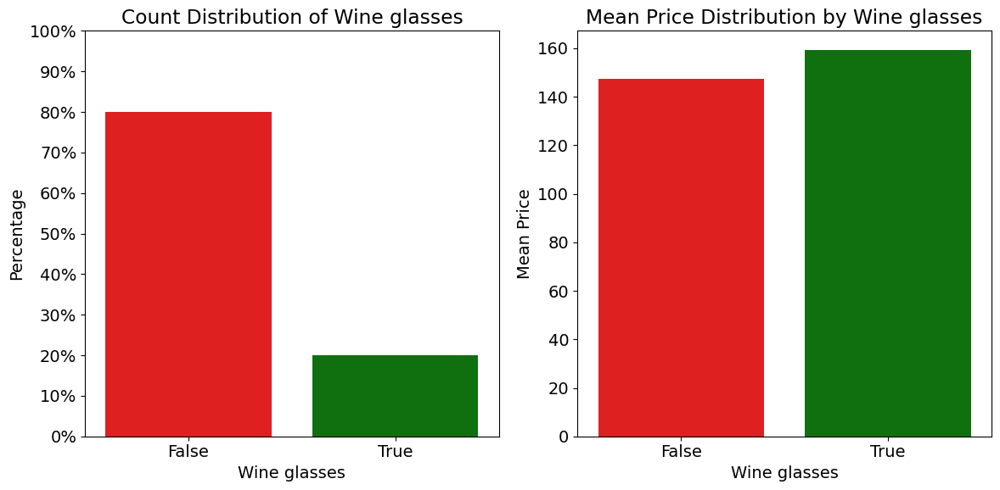

% Wise Split of Wine glasses:
Wine glasses
False    79.948955
True     20.051045
Name: proportion, dtype: float64

P-value for Wine glasses: 3.0047922878304807e-10
Wine glasses is statistically significant (p-value < 0.05)


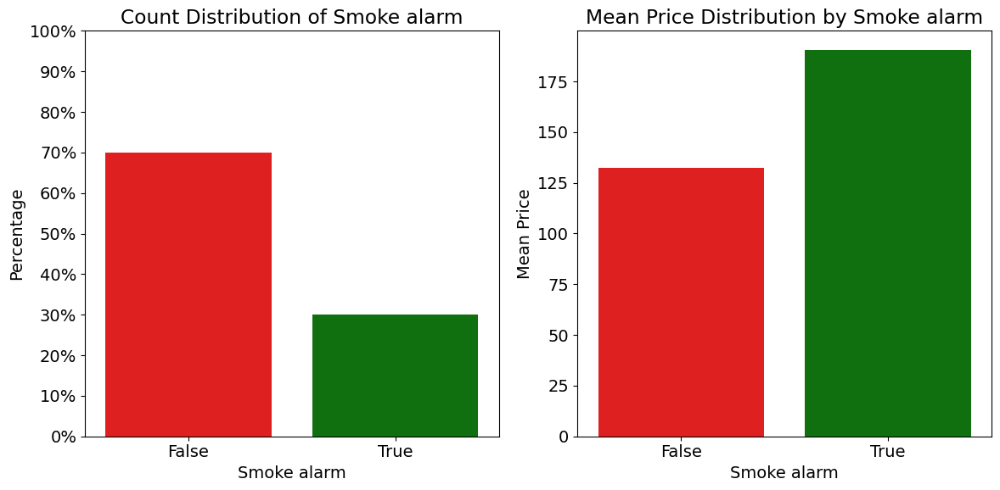

% Wise Split of Smoke alarm:
Smoke alarm
False    69.982493
True     30.017507
Name: proportion, dtype: float64

P-value for Smoke alarm: 6.482332768692568e-138
Smoke alarm is statistically significant (p-value < 0.05)


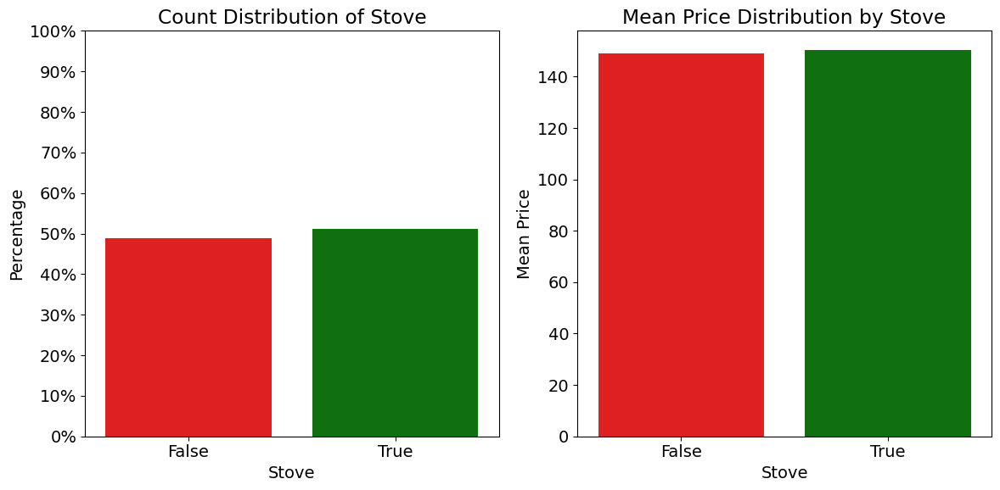

% Wise Split of Stove:
stove
True     51.057816
False    48.942184
Name: proportion, dtype: float64

P-value for Stove: 0.49183419025051245
Stove is not statistically significant (p-value >= 0.05)


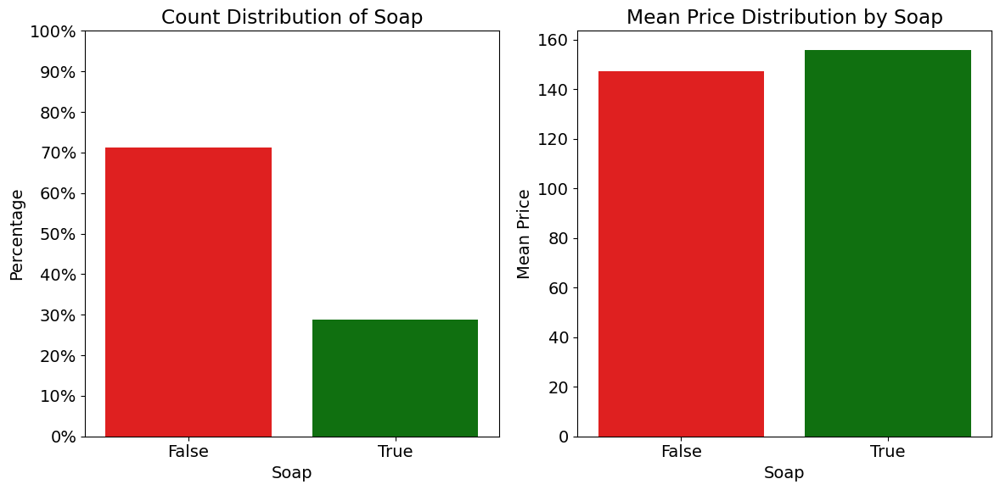

% Wise Split of Soap:
soap
False    71.140501
True     28.859499
Name: proportion, dtype: float64

P-value for Soap: 1.2843952797736922e-06
Soap is statistically significant (p-value < 0.05)


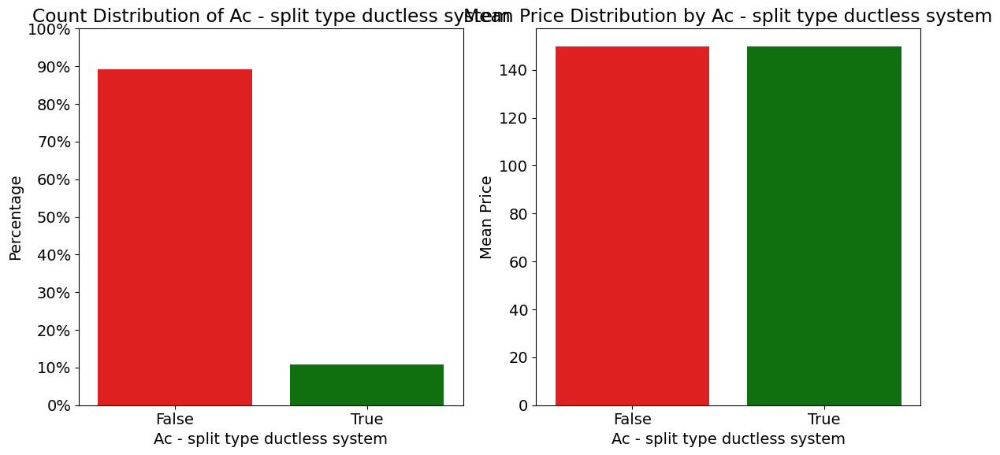

% Wise Split of Ac - split type ductless system:
AC - split type ductless system
False    89.164505
True     10.835495
Name: proportion, dtype: float64

P-value for Ac - split type ductless system: 0.9895952295092303
Ac - split type ductless system is not statistically significant (p-value >= 0.05)


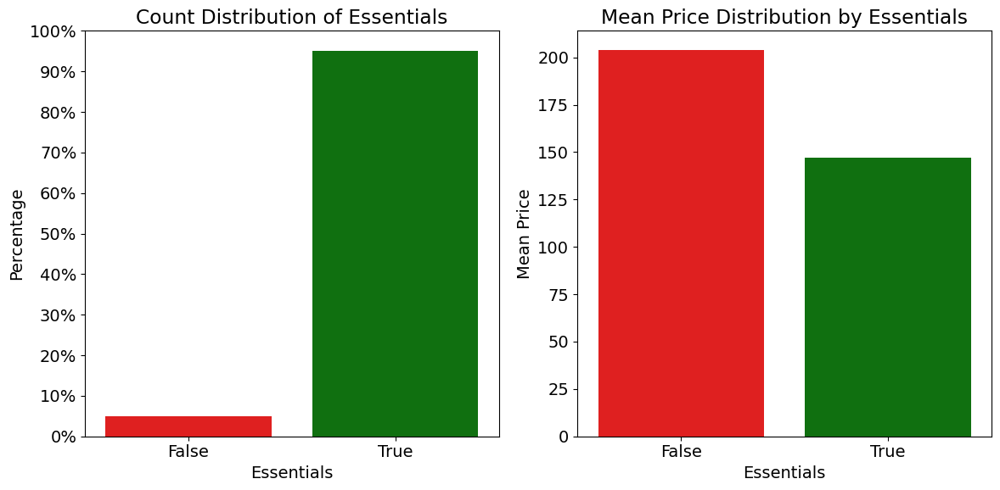

% Wise Split of Essentials:
Essentials
True     95.026261
False     4.973739
Name: proportion, dtype: float64

P-value for Essentials: 1.7501288907049542e-11
Essentials is statistically significant (p-value < 0.05)


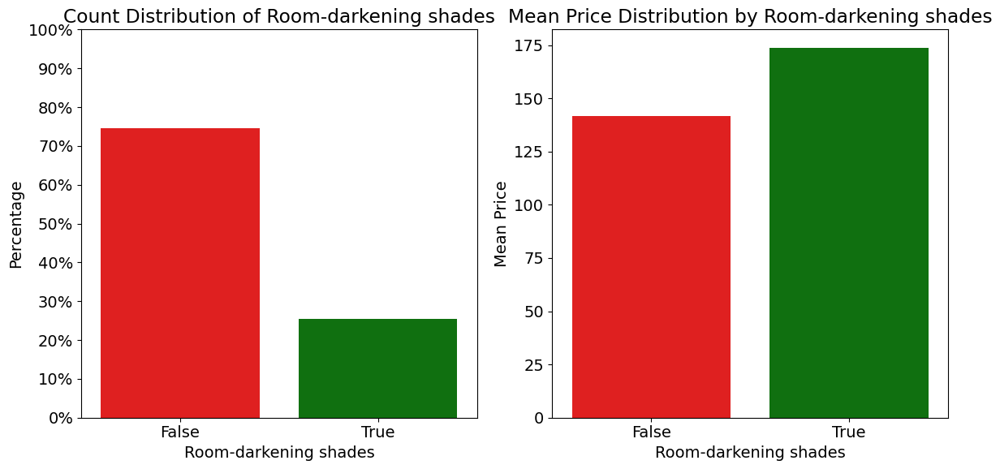

% Wise Split of Room-darkening shades:
Room-darkening shades
False    74.601869
True     25.398131
Name: proportion, dtype: float64

P-value for Room-darkening shades: 4.190486965064073e-36
Room-darkening shades is statistically significant (p-value < 0.05)


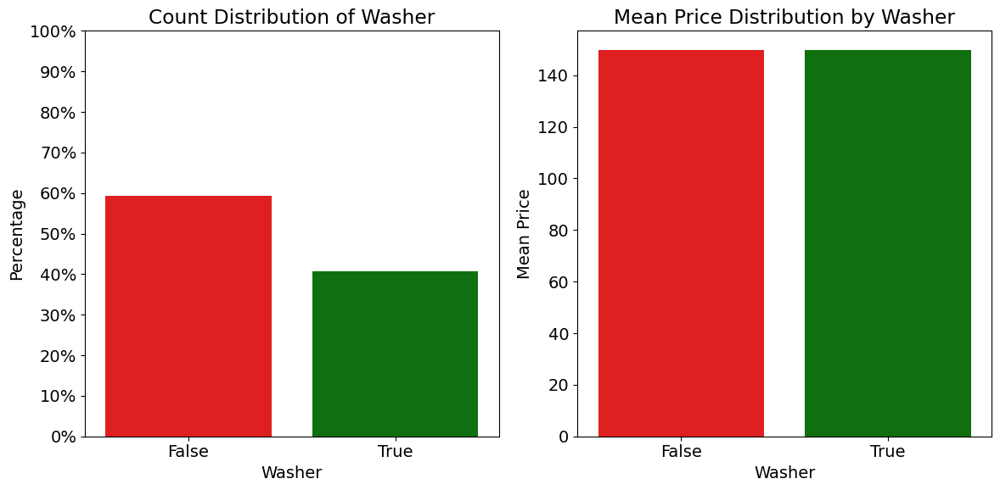

% Wise Split of Washer:
Washer
False    59.376912
True     40.623088
Name: proportion, dtype: float64

P-value for Washer: 0.9649690711577634
Washer is not statistically significant (p-value >= 0.05)


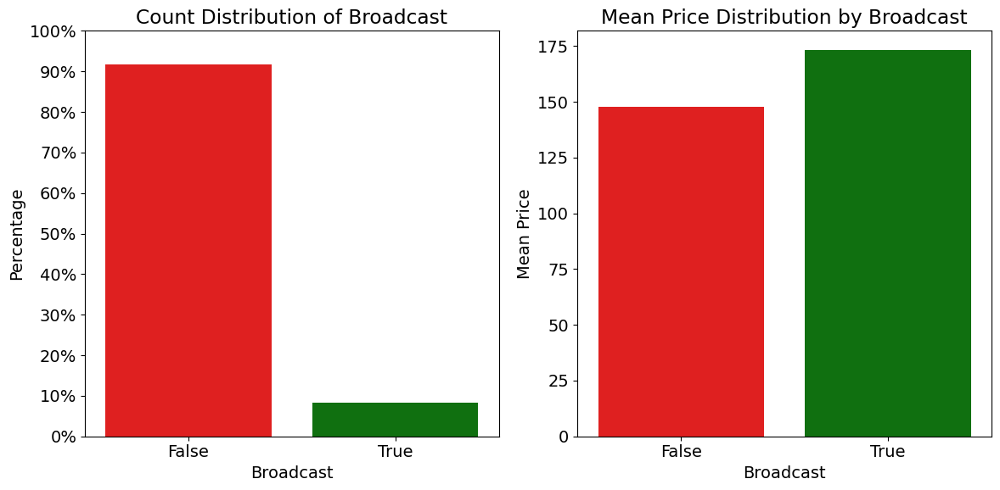

% Wise Split of Broadcast:
broadcast
False    91.777932
True      8.222068
Name: proportion, dtype: float64

P-value for Broadcast: 1.52749490881266e-26
Broadcast is statistically significant (p-value < 0.05)


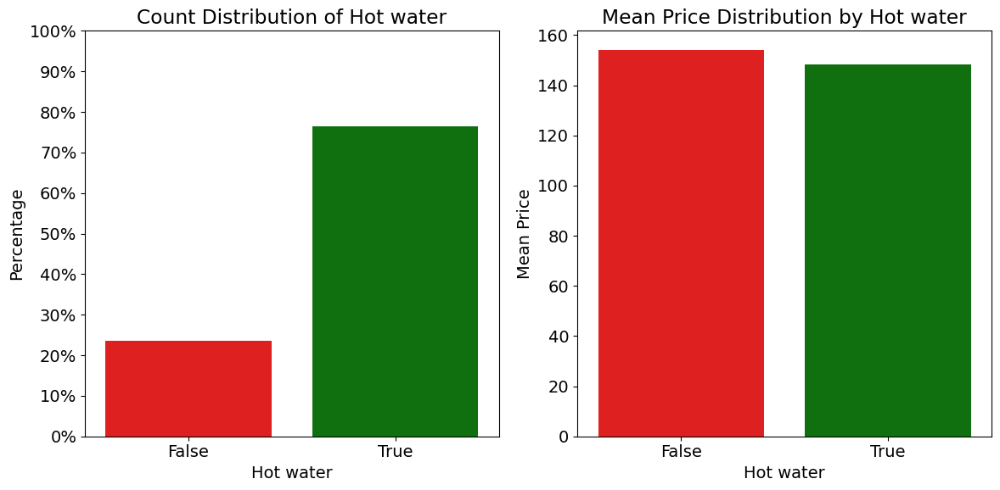

% Wise Split of Hot water:
Hot water
True     76.350482
False    23.649518
Name: proportion, dtype: float64

P-value for Hot water: 0.008419443110082976
Hot water is statistically significant (p-value < 0.05)


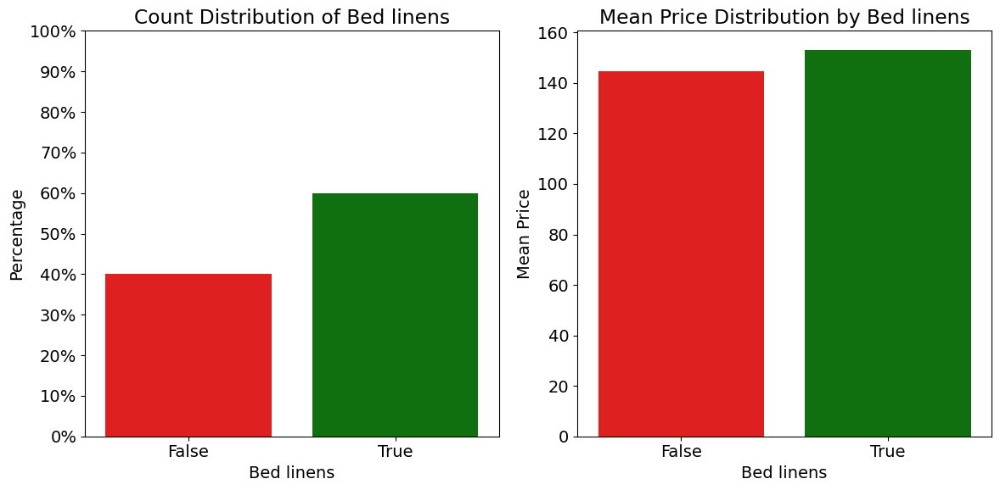

% Wise Split of Bed linens:
Bed linens
True     59.910566
False    40.089434
Name: proportion, dtype: float64

P-value for Bed linens: 7.2830890884858285e-06
Bed linens is statistically significant (p-value < 0.05)


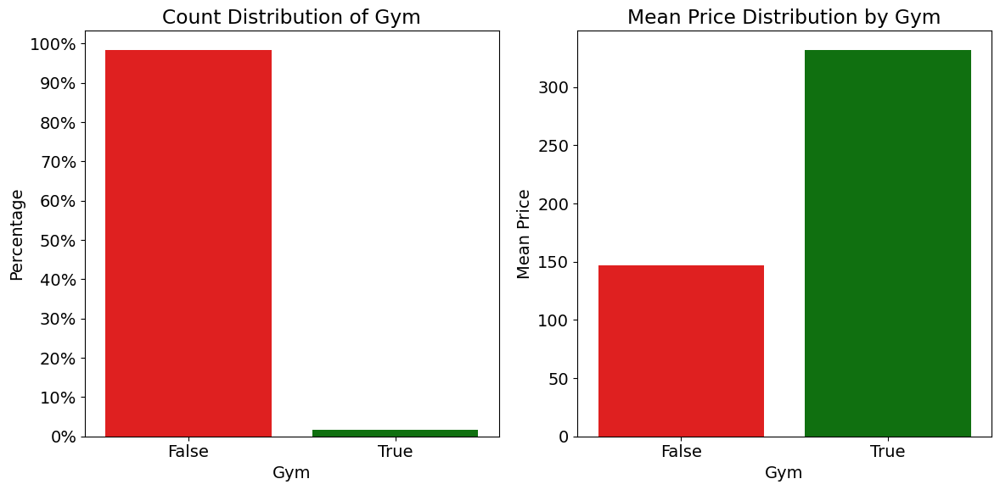

% Wise Split of Gym:
gym
False    98.329431
True      1.670569
Name: proportion, dtype: float64

P-value for Gym: 9.56054464358478e-15
Gym is statistically significant (p-value < 0.05)


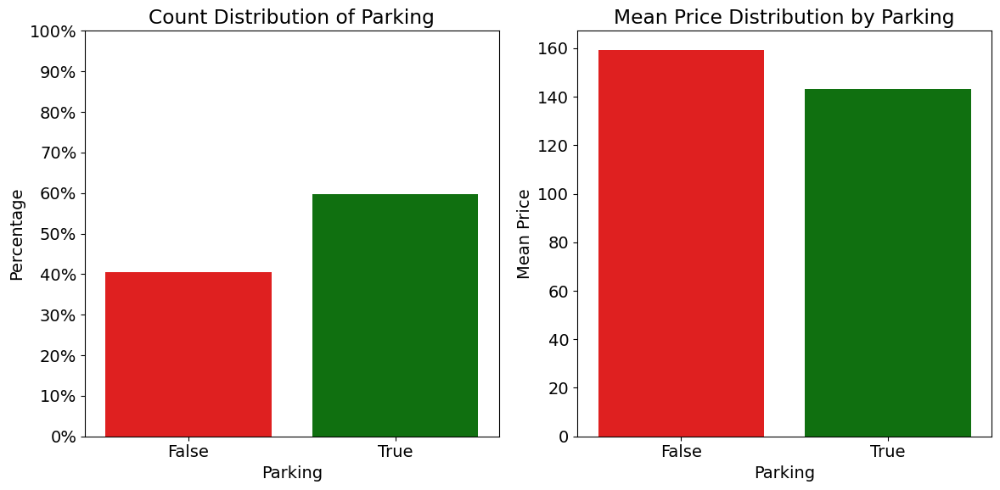

% Wise Split of Parking:
parking
True     59.615263
False    40.384737
Name: proportion, dtype: float64

P-value for Parking: 3.0626617597618715e-19
Parking is statistically significant (p-value < 0.05)


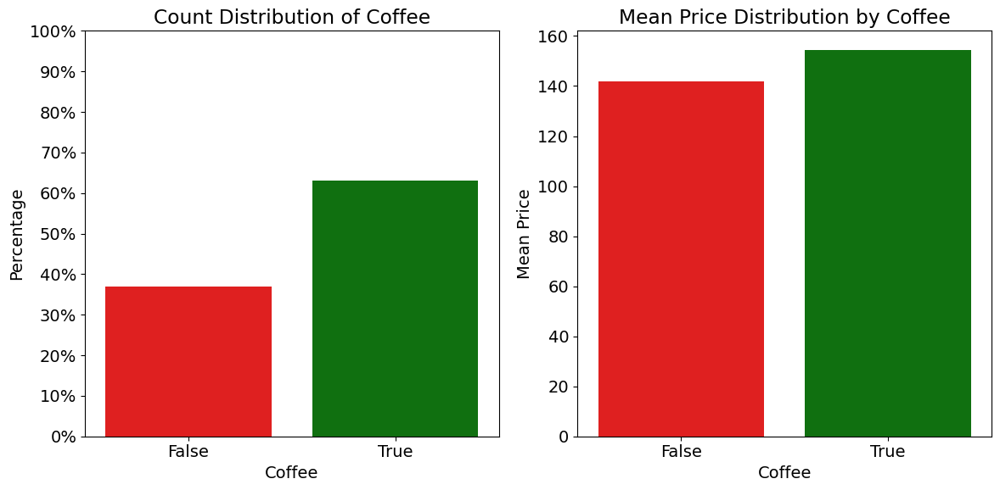

% Wise Split of Coffee:
coffee
True     63.074522
False    36.925478
Name: proportion, dtype: float64

P-value for Coffee: 4.15529573815254e-11
Coffee is statistically significant (p-value < 0.05)


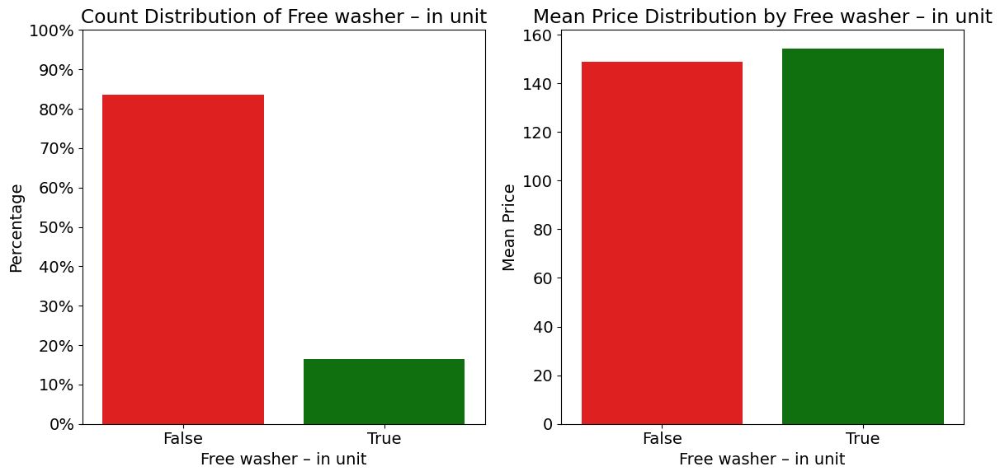

% Wise Split of Free washer – in unit:
Free washer – In unit
False    83.555865
True     16.444135
Name: proportion, dtype: float64

P-value for Free washer – in unit: 0.005998654895290963
Free washer – in unit is statistically significant (p-value < 0.05)


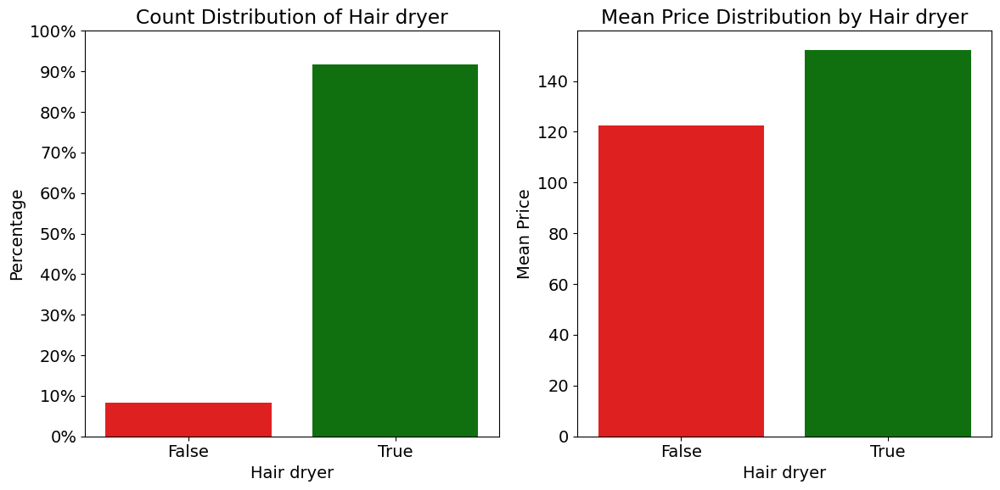

% Wise Split of Hair dryer:
Hair dryer
True     91.683014
False     8.316986
Name: proportion, dtype: float64

P-value for Hair dryer: 2.791940751185997e-31
Hair dryer is statistically significant (p-value < 0.05)


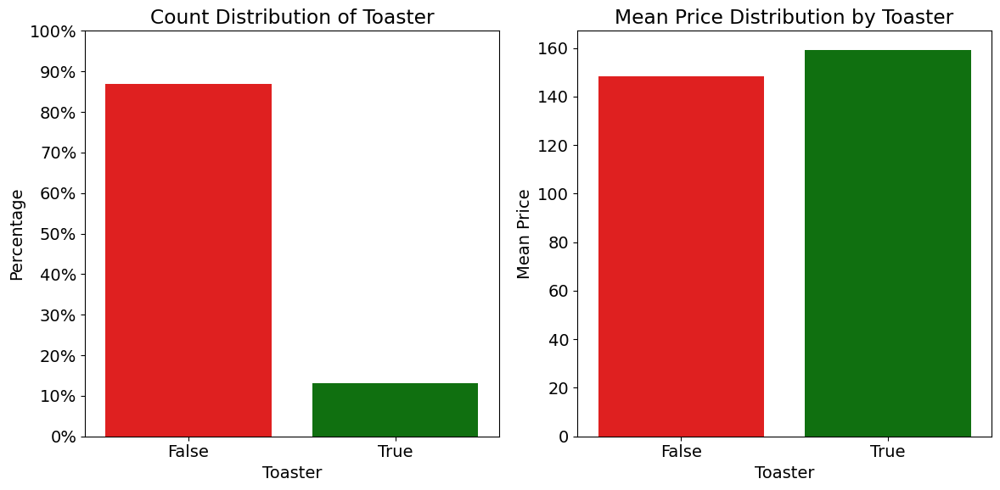

% Wise Split of Toaster:
Toaster
False    86.808412
True     13.191588
Name: proportion, dtype: float64

P-value for Toaster: 3.2708258751112773e-06
Toaster is statistically significant (p-value < 0.05)


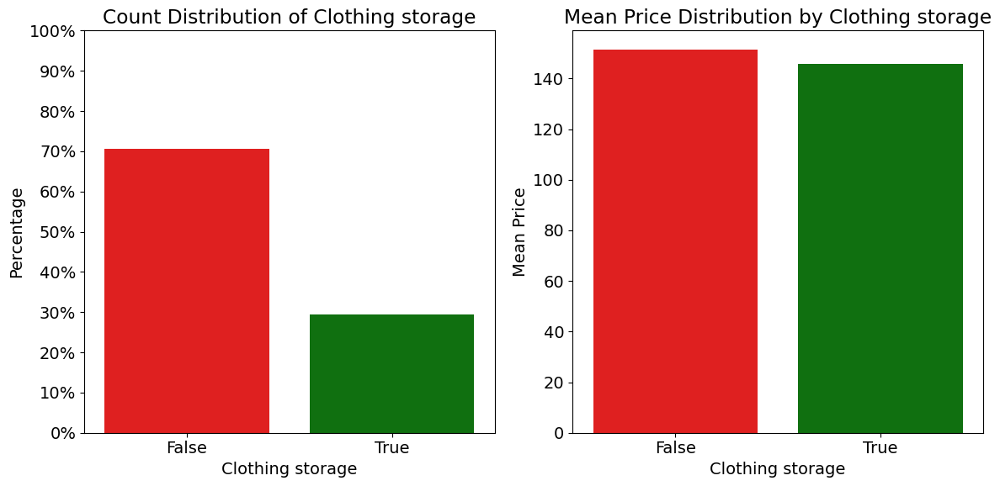

% Wise Split of Clothing storage:
clothing storage
False    70.680672
True     29.319328
Name: proportion, dtype: float64

P-value for Clothing storage: 0.001019393262965879
Clothing storage is statistically significant (p-value < 0.05)


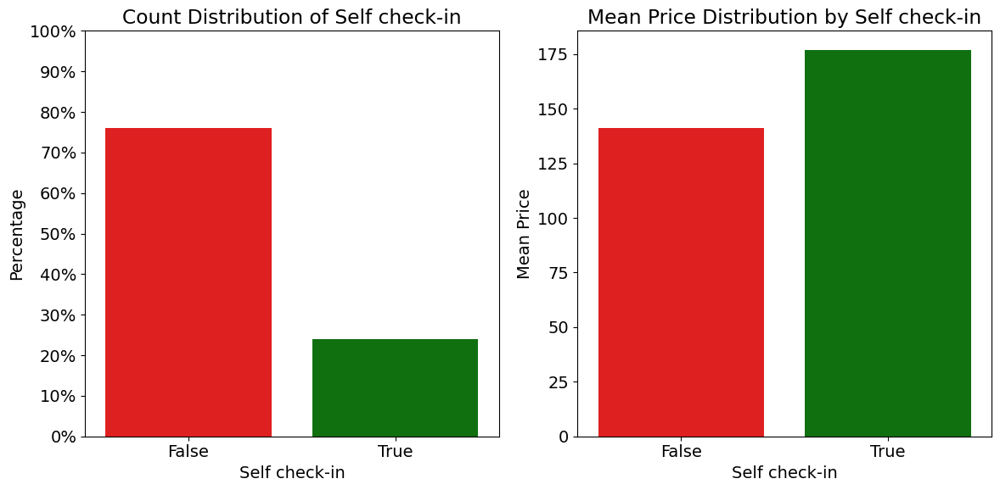

% Wise Split of Self check-in:
Self check-in
False    76.099475
True     23.900525
Name: proportion, dtype: float64

P-value for Self check-in: 2.034280581742223e-50
Self check-in is statistically significant (p-value < 0.05)


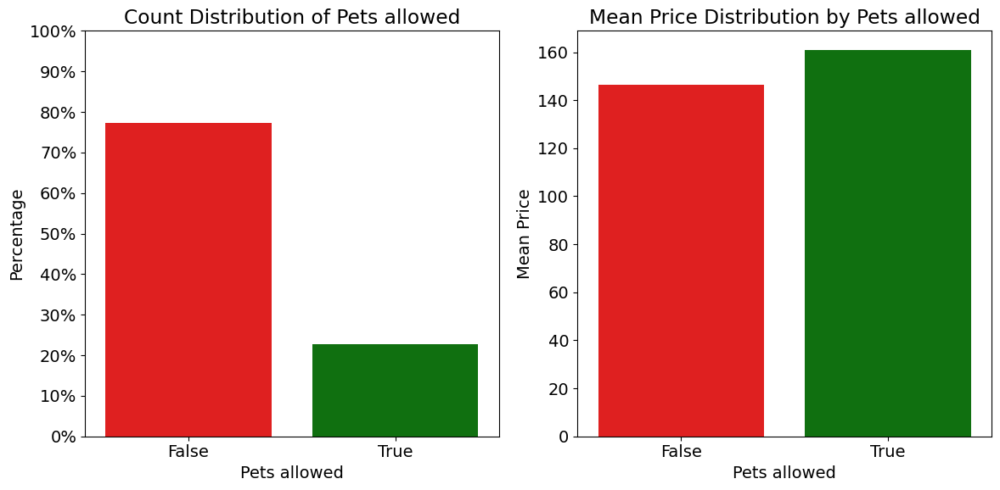

% Wise Split of Pets allowed:
Pets allowed
False    77.346074
True     22.653926
Name: proportion, dtype: float64

P-value for Pets allowed: 1.4117922686352253e-07
Pets allowed is statistically significant (p-value < 0.05)


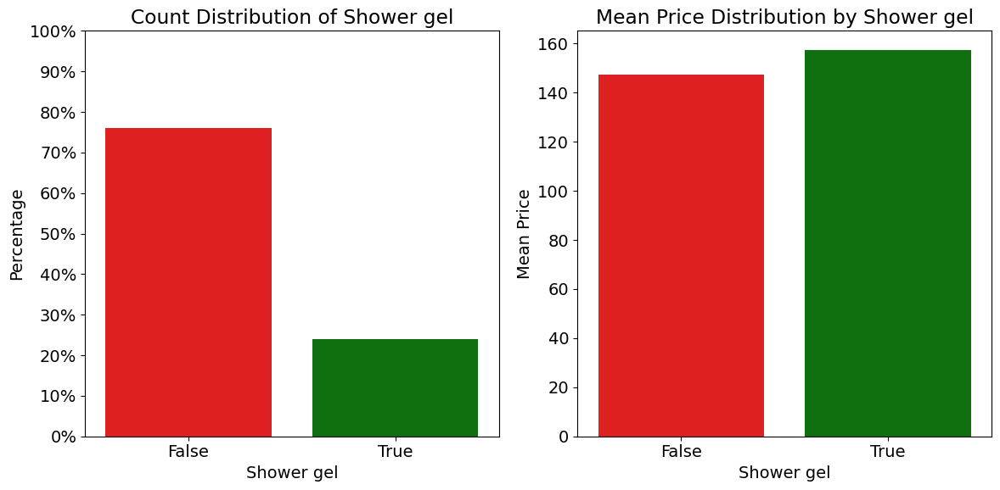

% Wise Split of Shower gel:
Shower gel
False    75.958151
True     24.041849
Name: proportion, dtype: float64

P-value for Shower gel: 4.7748158390000534e-08
Shower gel is statistically significant (p-value < 0.05)


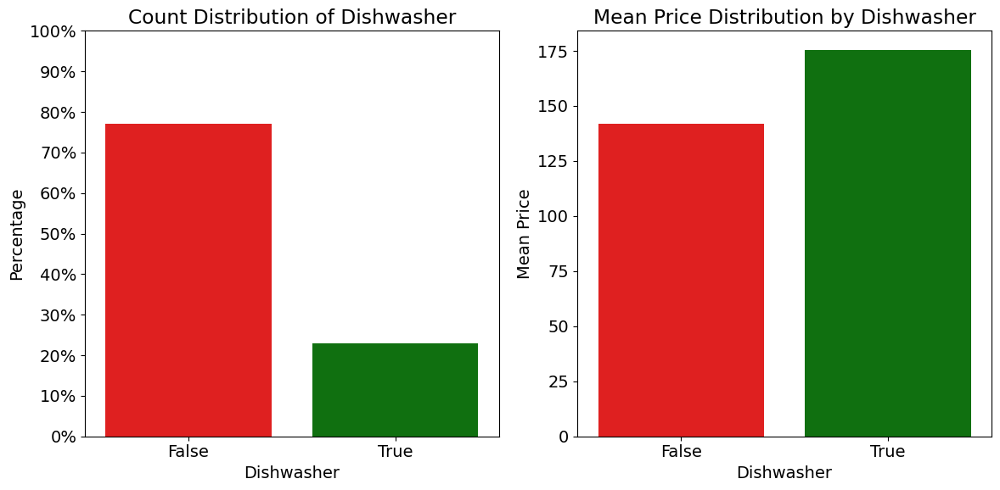

% Wise Split of Dishwasher:
Dishwasher
False    77.038115
True     22.961885
Name: proportion, dtype: float64

P-value for Dishwasher: 8.349962828068259e-61
Dishwasher is statistically significant (p-value < 0.05)


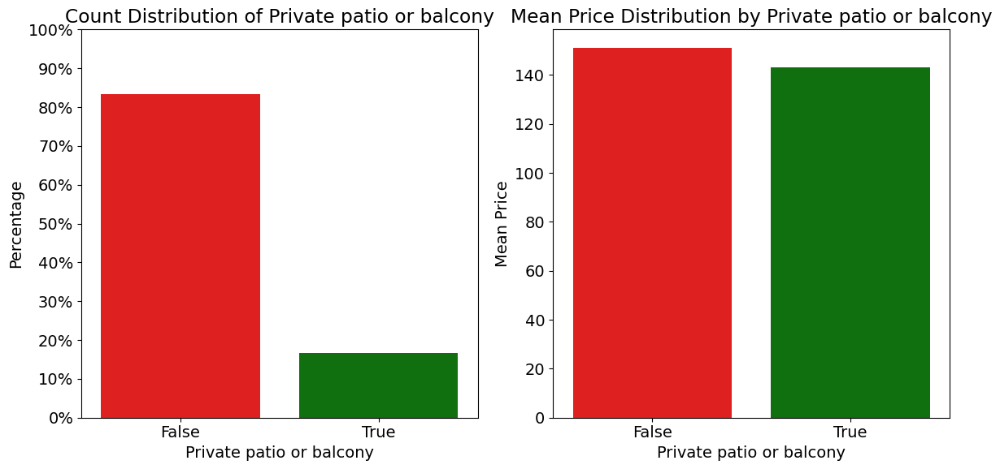

% Wise Split of Private patio or balcony:
Private patio or balcony
False    83.368137
True     16.631863
Name: proportion, dtype: float64

P-value for Private patio or balcony: 0.00021256896041234728
Private patio or balcony is statistically significant (p-value < 0.05)


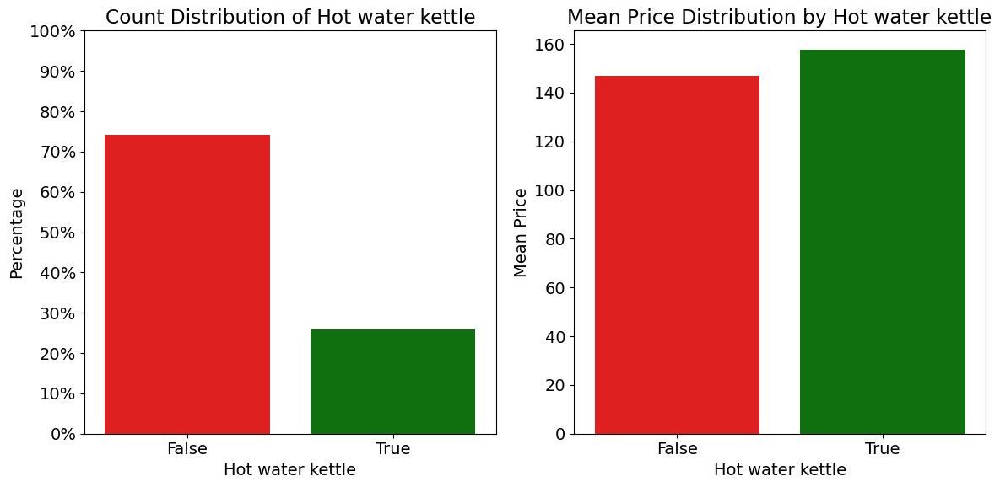

% Wise Split of Hot water kettle:
Hot water kettle
False    74.091417
True     25.908583
Name: proportion, dtype: float64

P-value for Hot water kettle: 3.1609019891032077e-09
Hot water kettle is statistically significant (p-value < 0.05)


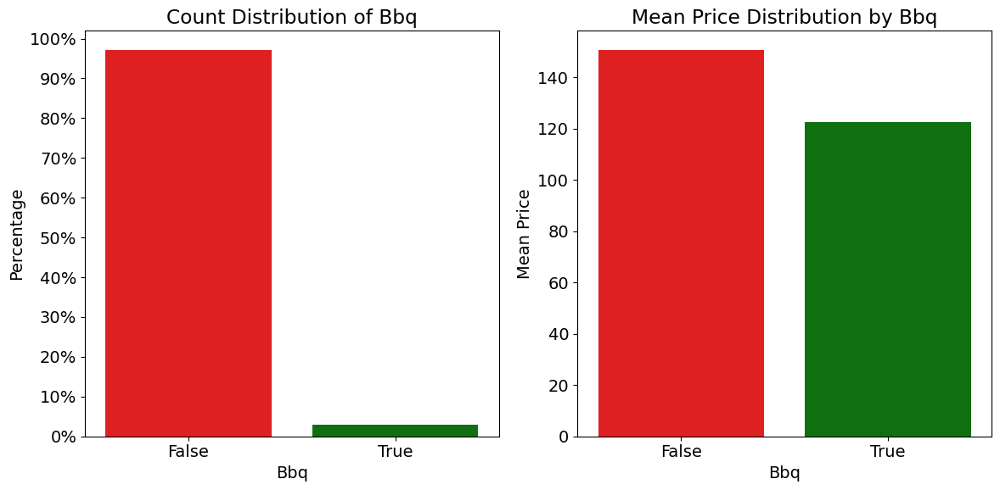

% Wise Split of Bbq:
bbq
False    97.095488
True      2.904512
Name: proportion, dtype: float64

P-value for Bbq: 5.651574571059903e-13
Bbq is statistically significant (p-value < 0.05)


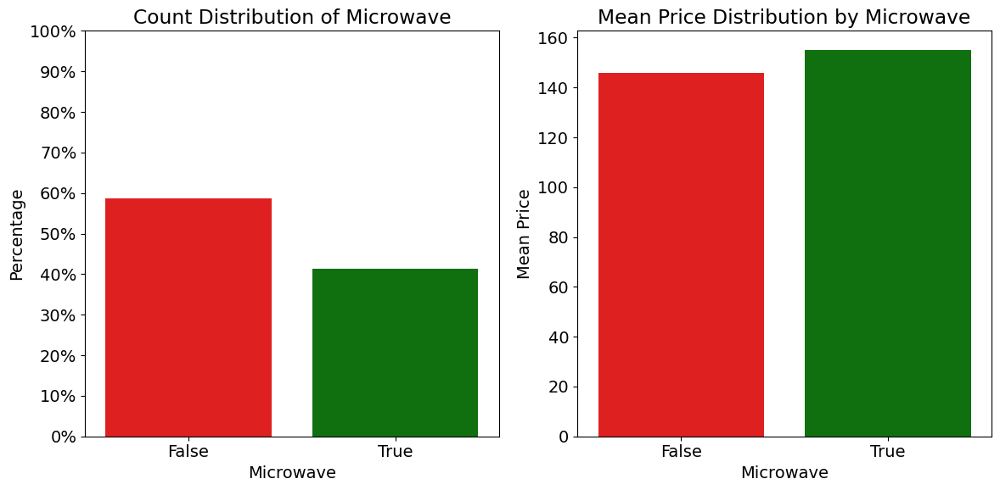

% Wise Split of Microwave:
Microwave
False    58.756776
True     41.243224
Name: proportion, dtype: float64

P-value for Microwave: 5.007893669318625e-07
Microwave is statistically significant (p-value < 0.05)


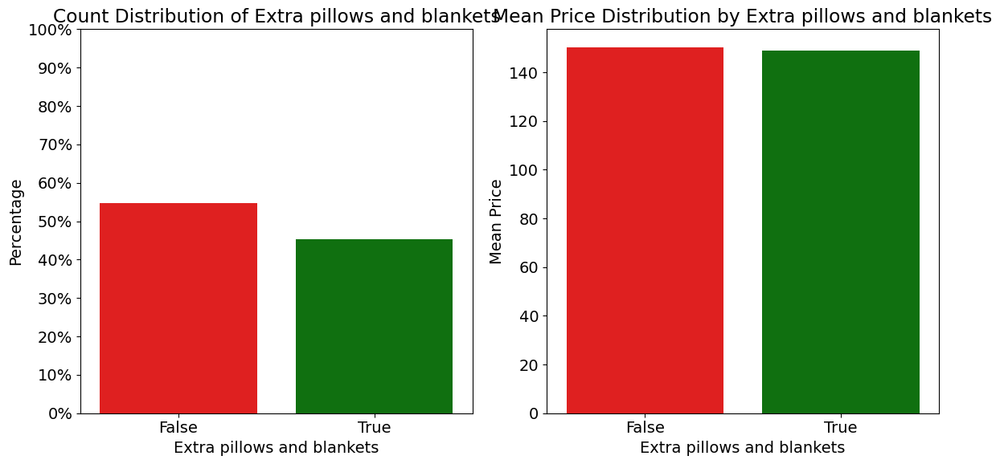

% Wise Split of Extra pillows and blankets:
Extra pillows and blankets
False    54.772301
True     45.227699
Name: proportion, dtype: float64

P-value for Extra pillows and blankets: 0.5259164781827033
Extra pillows and blankets is not statistically significant (p-value >= 0.05)


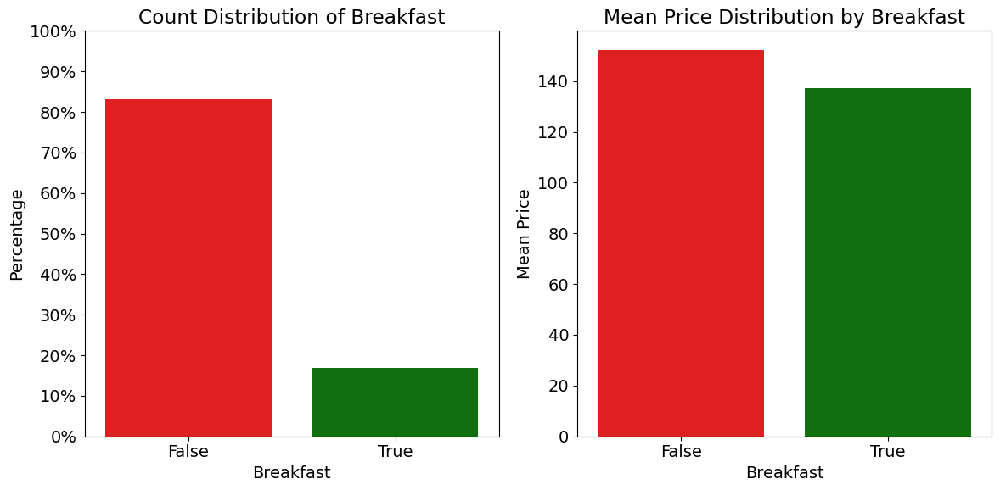

% Wise Split of Breakfast:
Breakfast
False    83.216267
True     16.783733
Name: proportion, dtype: float64

P-value for Breakfast: 4.2988802642701356e-11
Breakfast is statistically significant (p-value < 0.05)


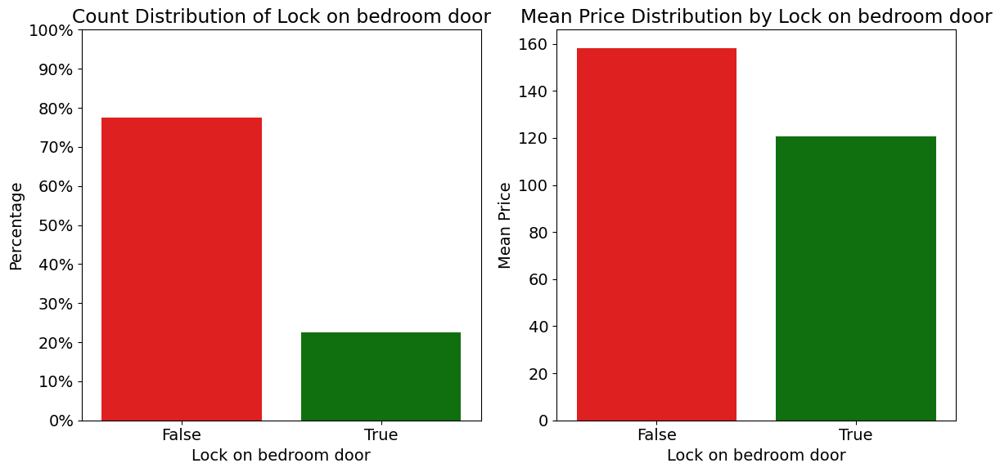

% Wise Split of Lock on bedroom door:
Lock on bedroom door
False    77.491616
True     22.508384
Name: proportion, dtype: float64

P-value for Lock on bedroom door: 2.229896996495065e-75
Lock on bedroom door is statistically significant (p-value < 0.05)


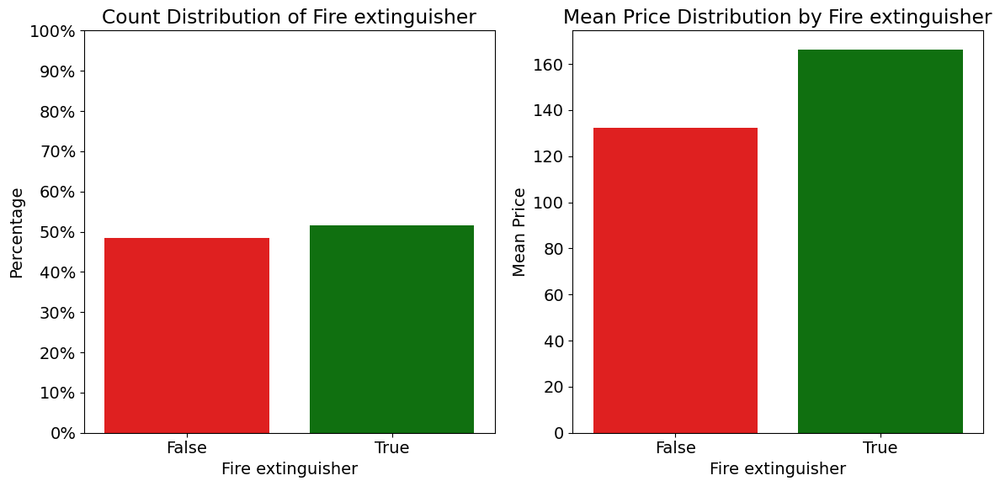

% Wise Split of Fire extinguisher:
Fire extinguisher
True     51.599907
False    48.400093
Name: proportion, dtype: float64

P-value for Fire extinguisher: 4.64820935284586e-78
Fire extinguisher is statistically significant (p-value < 0.05)


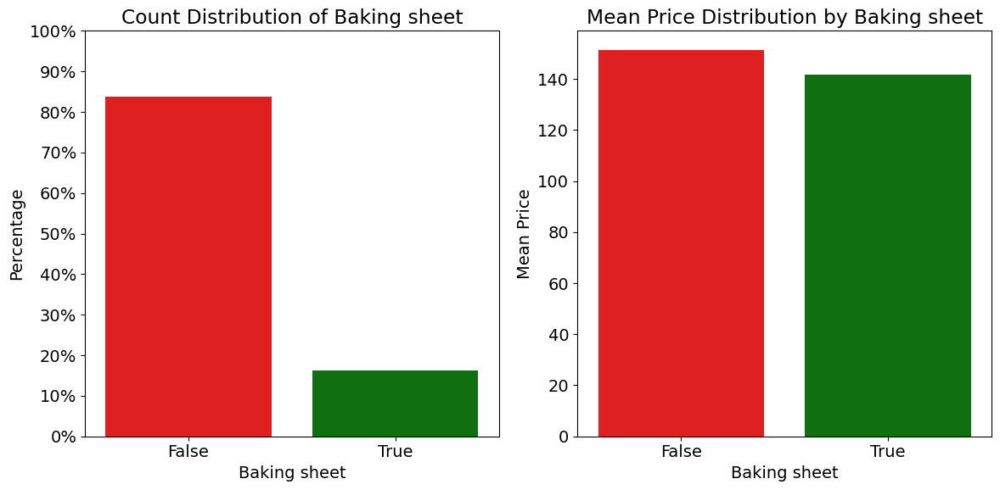

% Wise Split of Baking sheet:
Baking sheet
False    83.705626
True     16.294374
Name: proportion, dtype: float64

P-value for Baking sheet: 2.199221189465868e-06
Baking sheet is statistically significant (p-value < 0.05)


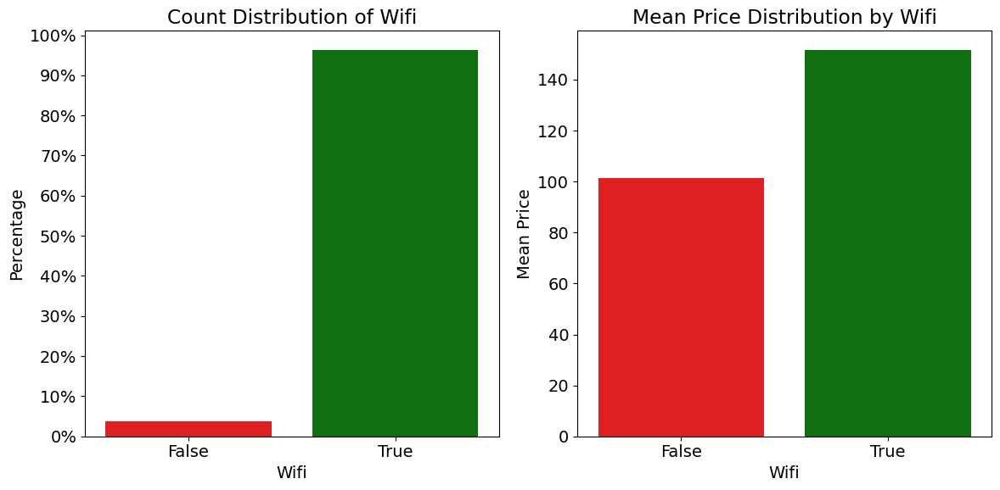

% Wise Split of Wifi:
wifi
True     96.262313
False     3.737687
Name: proportion, dtype: float64

P-value for Wifi: 6.843322794898131e-54
Wifi is statistically significant (p-value < 0.05)


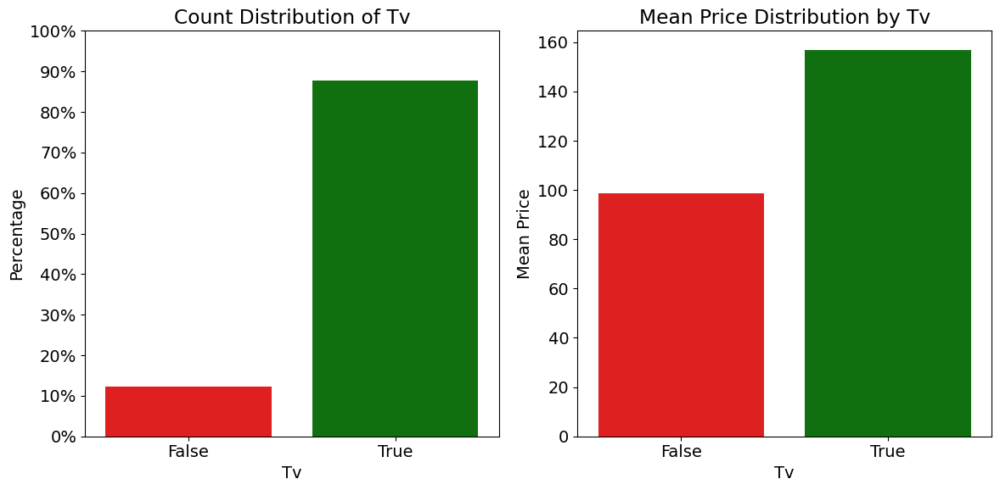

% Wise Split of Tv:
tv
True     87.808222
False    12.191778
Name: proportion, dtype: float64

P-value for Tv: 2.0595844541578495e-192
Tv is statistically significant (p-value < 0.05)


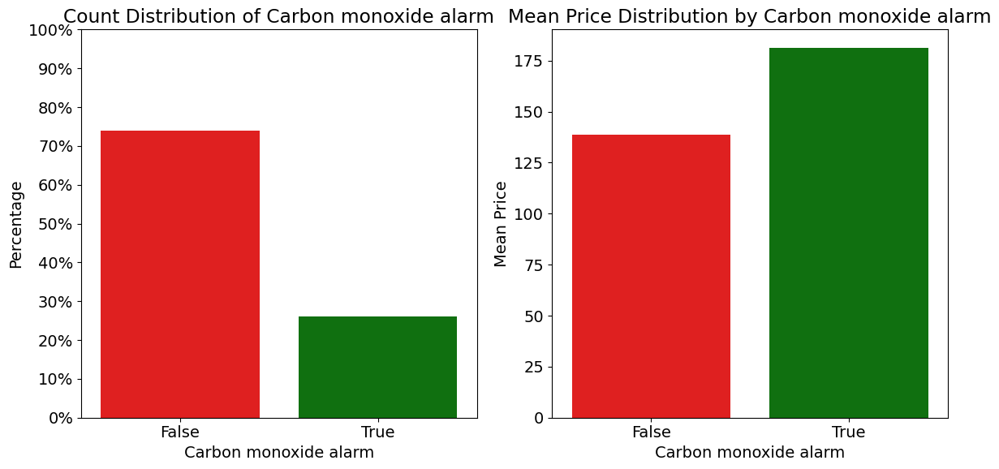

% Wise Split of Carbon monoxide alarm:
Carbon monoxide alarm
False    73.893143
True     26.106857
Name: proportion, dtype: float64

P-value for Carbon monoxide alarm: 2.141135169055136e-76
Carbon monoxide alarm is statistically significant (p-value < 0.05)


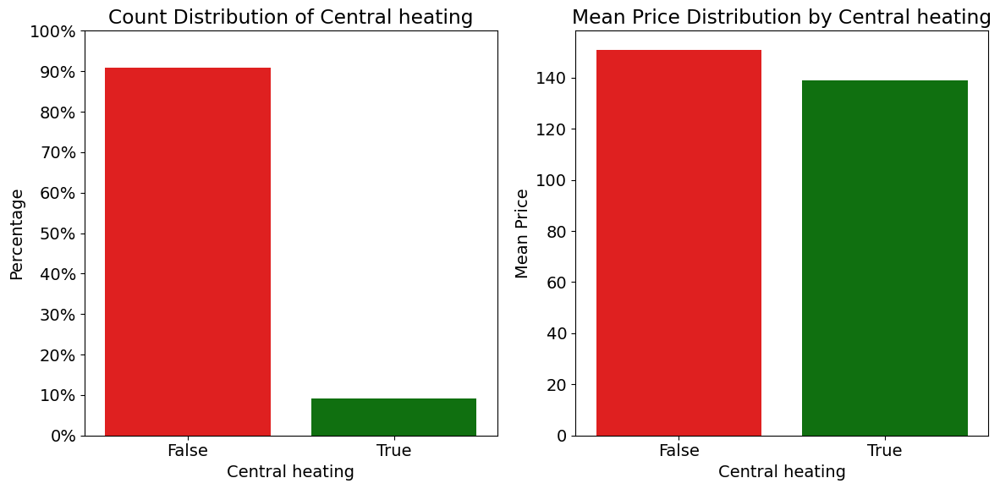

% Wise Split of Central heating:
Central heating
False    90.763357
True      9.236643
Name: proportion, dtype: float64

P-value for Central heating: 7.395089546224183e-08
Central heating is statistically significant (p-value < 0.05)


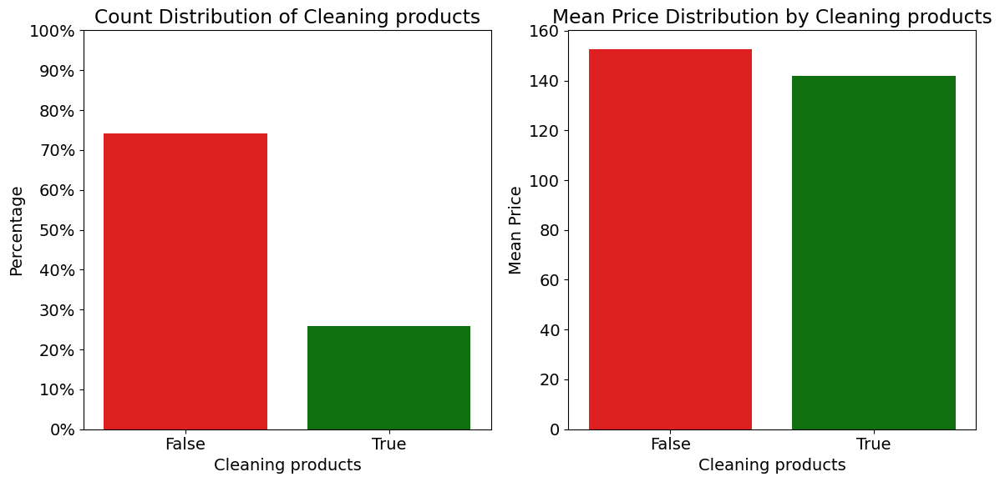

% Wise Split of Cleaning products:
Cleaning products
False    74.135713
True     25.864287
Name: proportion, dtype: float64

P-value for Cleaning products: 2.943742678707677e-10
Cleaning products is statistically significant (p-value < 0.05)


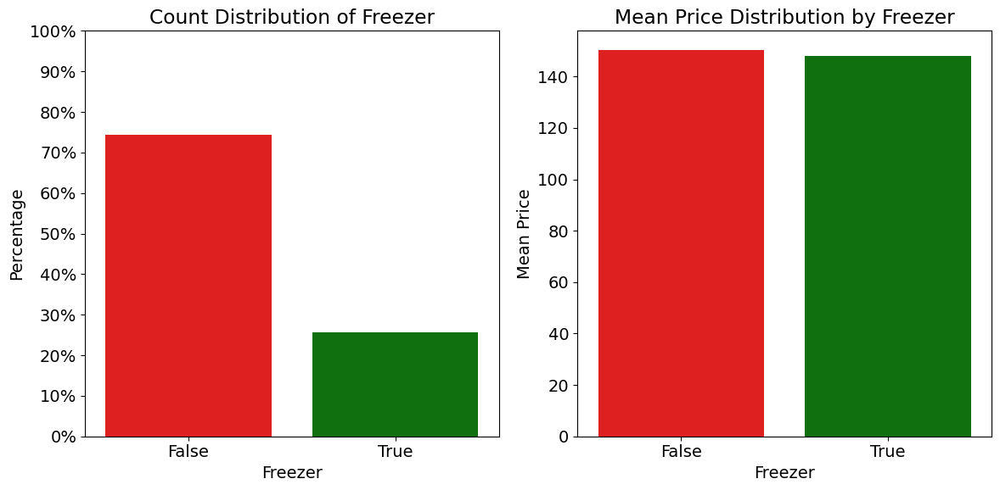

% Wise Split of Freezer:
Freezer
False    74.291801
True     25.708199
Name: proportion, dtype: float64

P-value for Freezer: 0.21399243412827673
Freezer is not statistically significant (p-value >= 0.05)


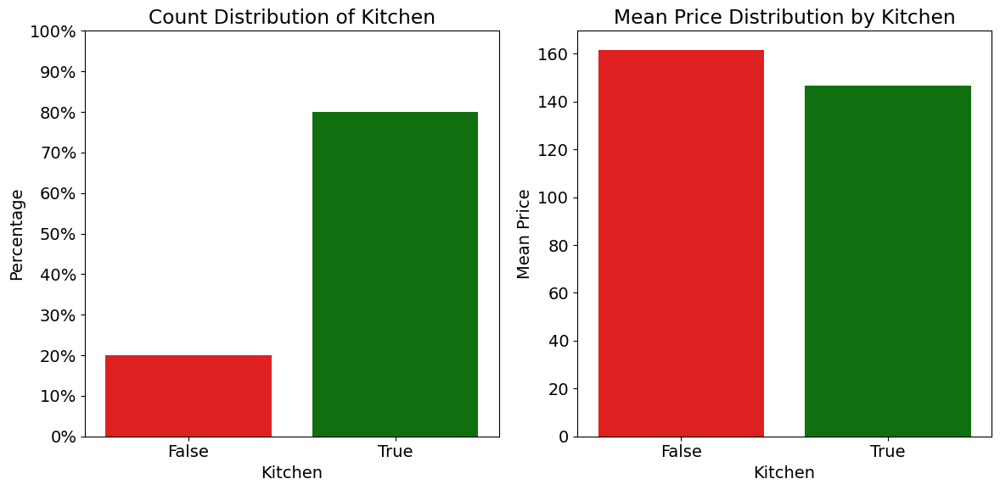

% Wise Split of Kitchen:
Kitchen
True     80.02278
False    19.97722
Name: proportion, dtype: float64

P-value for Kitchen: 2.124284147124921e-08
Kitchen is statistically significant (p-value < 0.05)


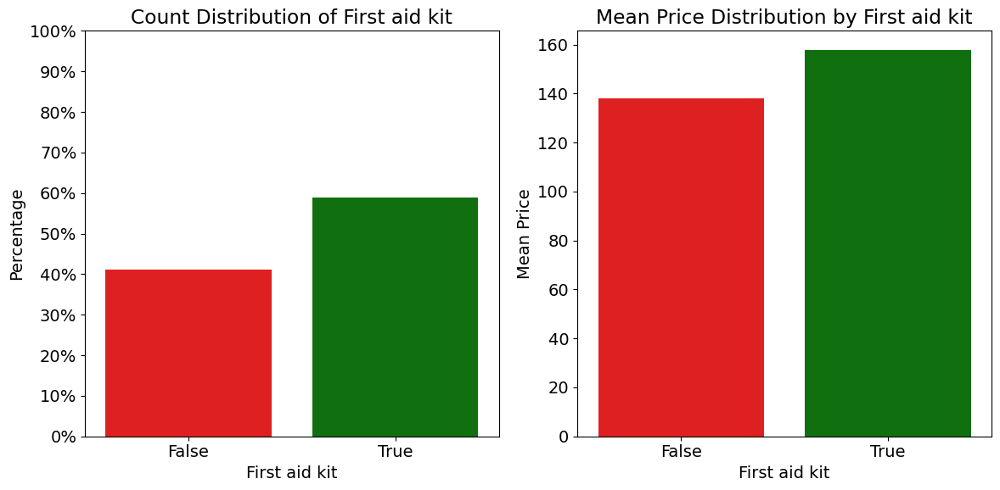

% Wise Split of First aid kit:
First aid kit
True     58.845367
False    41.154633
Name: proportion, dtype: float64

P-value for First aid kit: 4.756023792658209e-24
First aid kit is statistically significant (p-value < 0.05)


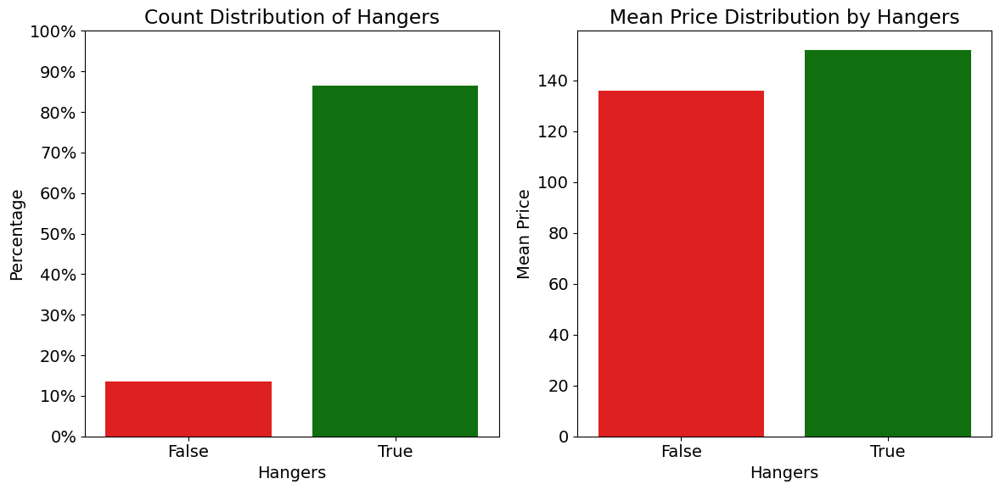

% Wise Split of Hangers:
Hangers
True     86.416081
False    13.583919
Name: proportion, dtype: float64

P-value for Hangers: 4.502815141643206e-18
Hangers is statistically significant (p-value < 0.05)


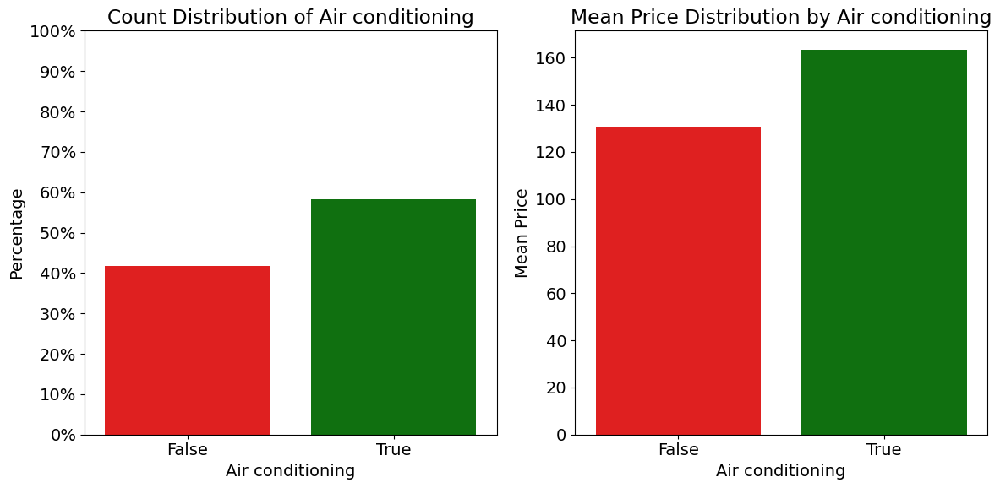

% Wise Split of Air conditioning:
Air conditioning
True     58.19992
False    41.80008
Name: proportion, dtype: float64

P-value for Air conditioning: 1.6203022365892382e-73
Air conditioning is statistically significant (p-value < 0.05)


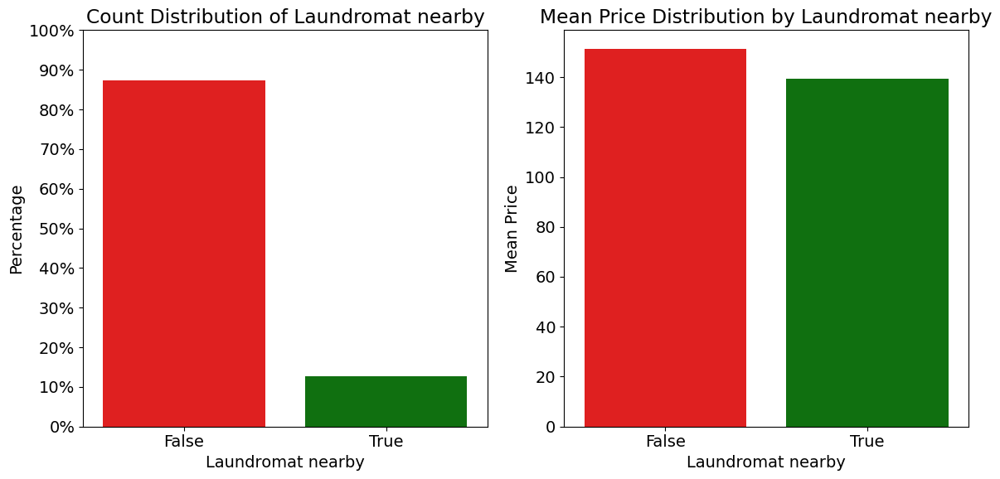

% Wise Split of Laundromat nearby:
Laundromat nearby
False    87.213398
True     12.786602
Name: proportion, dtype: float64

P-value for Laundromat nearby: 8.37546402841452e-08
Laundromat nearby is statistically significant (p-value < 0.05)


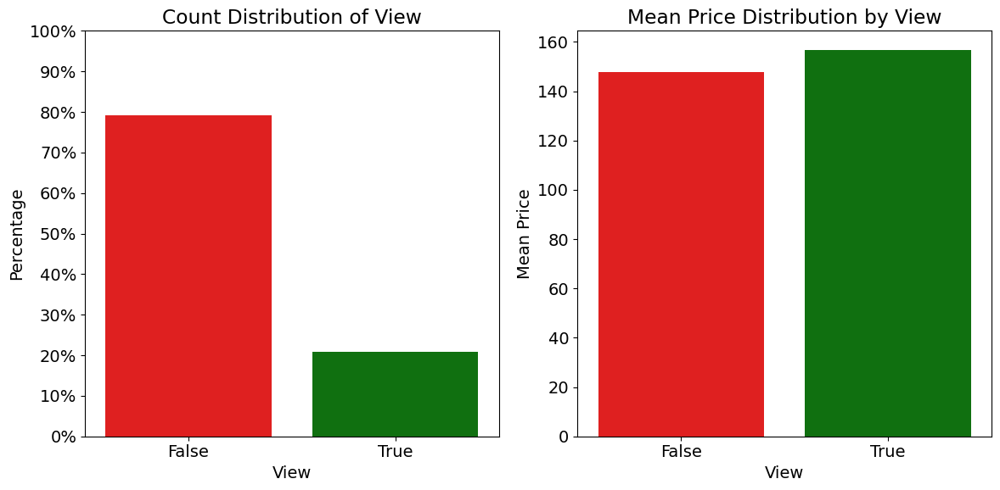

% Wise Split of View:
view
False    79.11578
True     20.88422
Name: proportion, dtype: float64

P-value for View: 9.884678170158982e-06
View is statistically significant (p-value < 0.05)


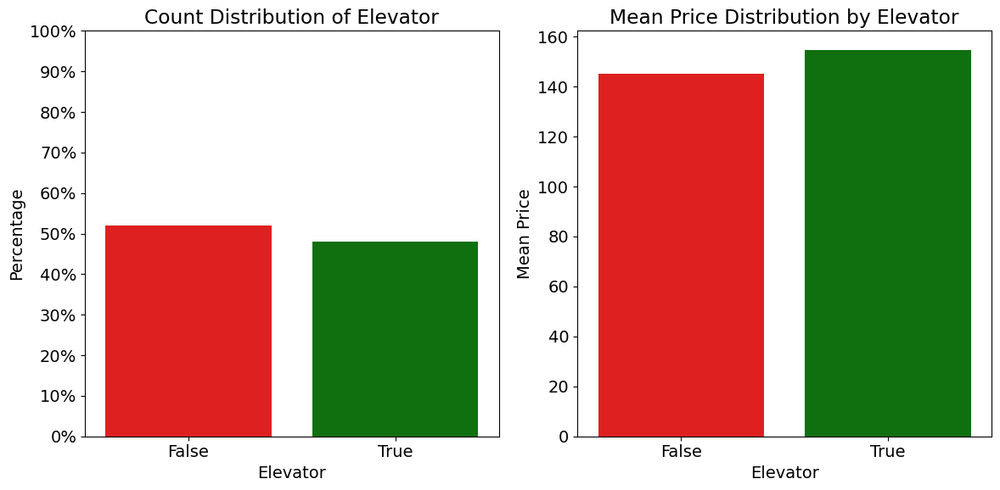

% Wise Split of Elevator:
Elevator
False    52.011221
True     47.988779
Name: proportion, dtype: float64

P-value for Elevator: 3.469979608498124e-07
Elevator is statistically significant (p-value < 0.05)


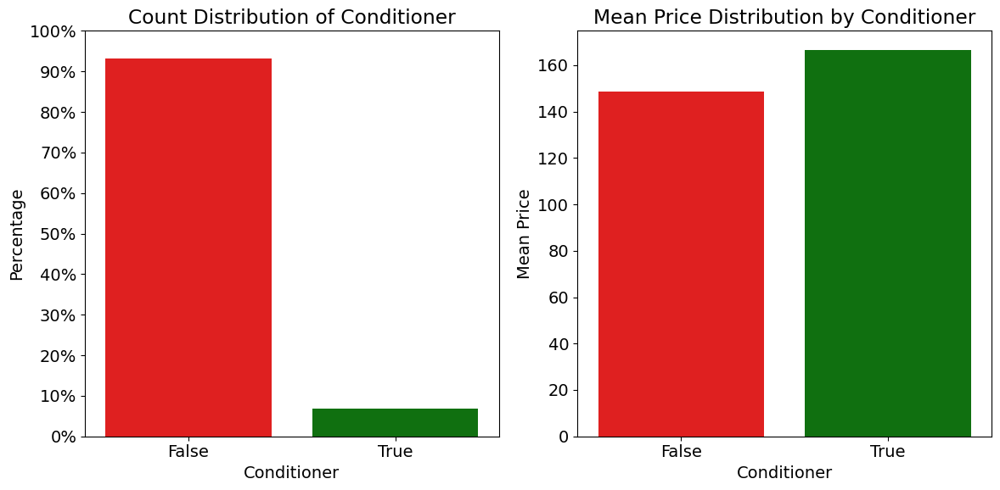

% Wise Split of Conditioner:
conditioner
False    93.199603
True      6.800397
Name: proportion, dtype: float64

P-value for Conditioner: 1.3436504186202936e-05
Conditioner is statistically significant (p-value < 0.05)


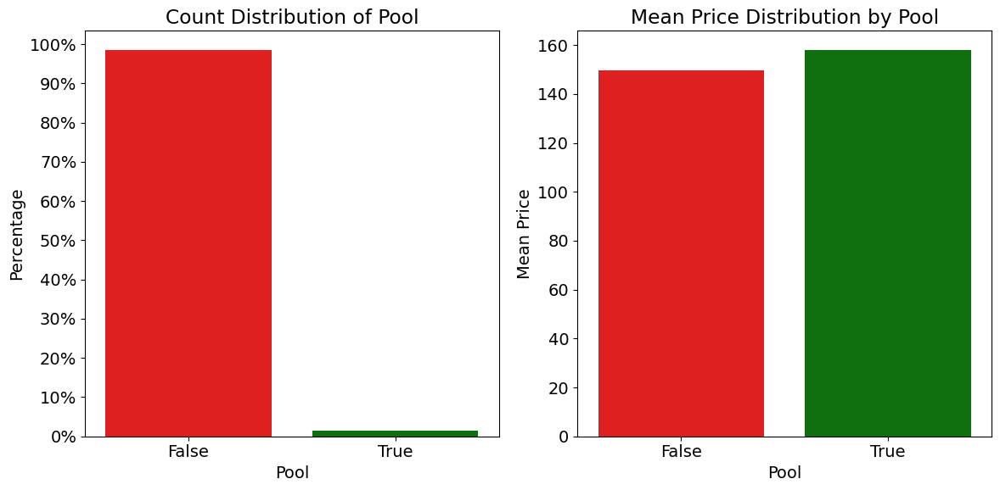

% Wise Split of Pool:
pool
False    98.466536
True      1.533464
Name: proportion, dtype: float64

P-value for Pool: 0.08517194286169692
Pool is not statistically significant (p-value >= 0.05)


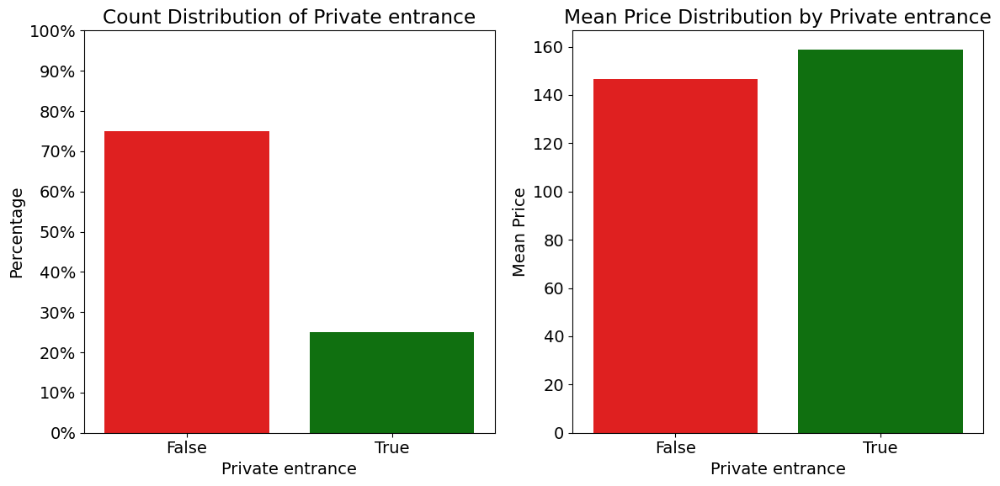

% Wise Split of Private entrance:
Private entrance
False    74.949904
True     25.050096
Name: proportion, dtype: float64

P-value for Private entrance: 6.420354511835607e-08
Private entrance is statistically significant (p-value < 0.05)


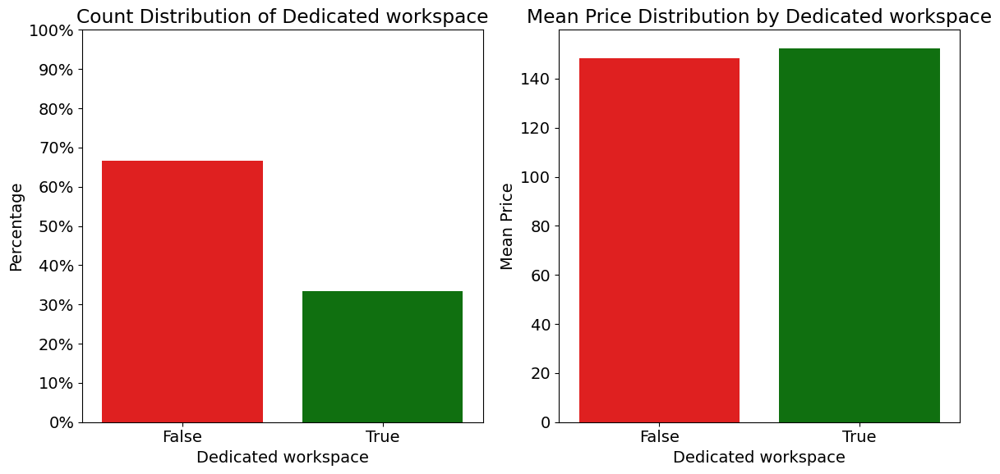

% Wise Split of Dedicated workspace:
Dedicated workspace
False    66.675104
True     33.324896
Name: proportion, dtype: float64

P-value for Dedicated workspace: 0.04019866238791112
Dedicated workspace is statistically significant (p-value < 0.05)


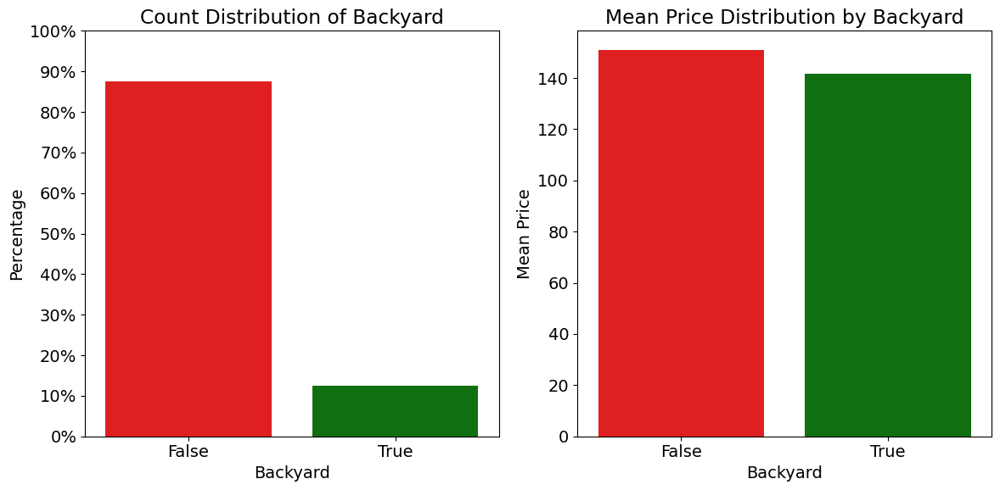

% Wise Split of Backyard:
backyard
False    87.472843
True     12.527157
Name: proportion, dtype: float64

P-value for Backyard: 0.007347079220819195
Backyard is statistically significant (p-value < 0.05)


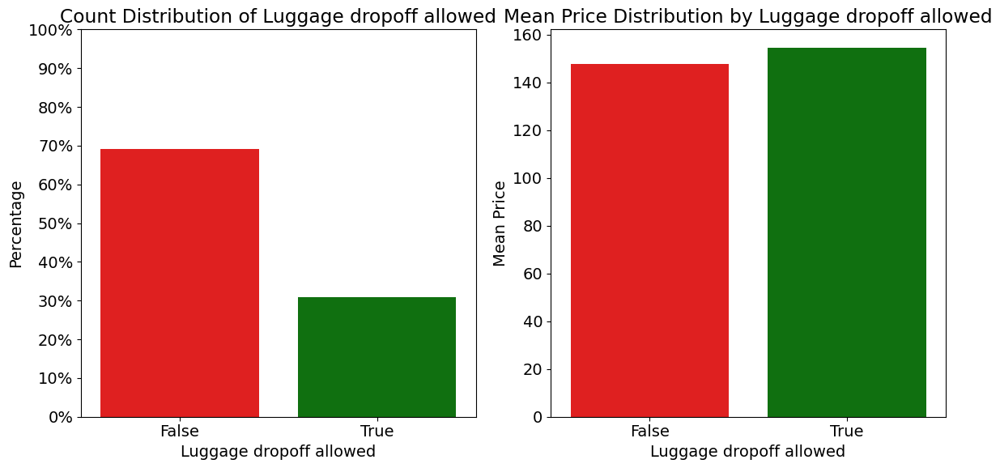

% Wise Split of Luggage dropoff allowed:
Luggage dropoff allowed
False    69.193613
True     30.806387
Name: proportion, dtype: float64

P-value for Luggage dropoff allowed: 0.002733236201985907
Luggage dropoff allowed is statistically significant (p-value < 0.05)


In [10]:
#doing the analysis for all the different amenities
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = 20, 20
column_indices = list(range(30, 94))
result = [binary_count_and_price_plot(col) for col in dataframe1.iloc[:,column_indices].columns]

## Price variation based on rating

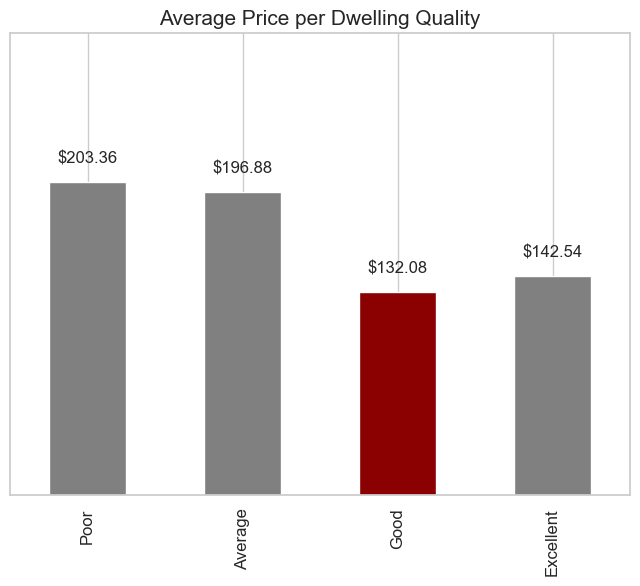

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Cut the 'review_scores_value' into categories
categories = pd.cut(dataframe1['review_scores_rating'].dropna(), 4, labels=['Poor', 'Average', 'Good', 'Excellent'])
dataframe1['Lodging Quality'] = categories

# Filter out residences with no customer evaluation
no_nan = dataframe1[~dataframe1['review_scores_rating'].isnull()]

# Set seaborn style
sns.set(style='whitegrid')

# Group by 'Lodging Quality' and calculate the average price for each category
groups = no_nan.groupby('Lodging Quality')['price'].mean()

# Set the figure size
plt.figure(figsize=(8, 6))

# Plot the bar chart with adjusted ylim
chart = groups.plot(kind='bar', ylim=(0, 300), xlabel='', yticks=[], fontsize=12, color=['grey', 'grey', 'darkred', 'grey'])

# Display average prices on top of the bars
for i, price in enumerate(groups):
    plt.text(i, price + 10, f'${price:.2f}', ha='center', va='bottom', fontdict={'size': 12})

# Set the graph title
plt.title('Average Price per Dwelling Quality', fontdict={'size': 15})

# Show the plot
plt.show()

## Price variation across amount of certain amenities

The percentage of listings with 1.0 bedroom(s) is: 69.89%
The percentage of listings with 2.0 bedroom(s) is: 23.11%
The percentage of listings with 3.0 bedroom(s) is: 4.19%
The percentage of listings with 0.0 bedroom(s) is: 2.81%


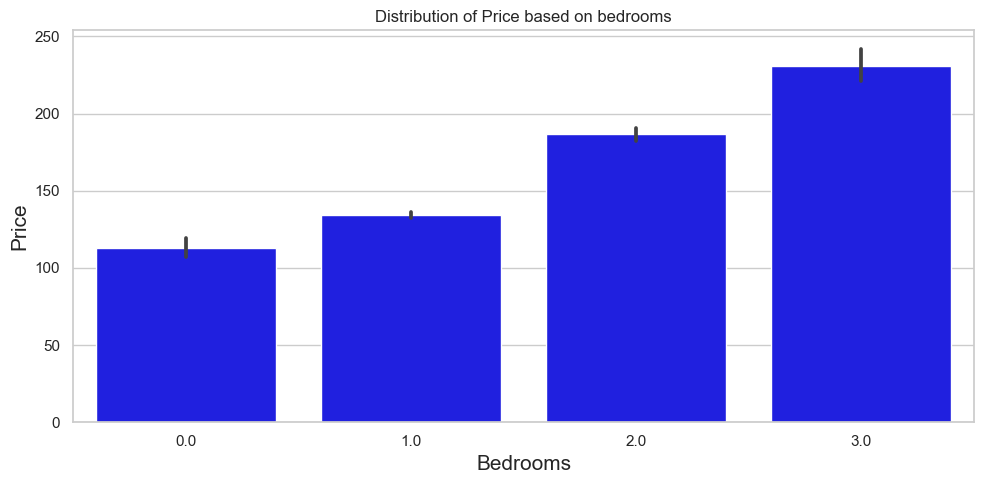

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

# Showing the distribution between price and the number of bedrooms
figsize = (10, 5)
x = 'bedrooms'

# Create a grid with 1 row and 1 column
fig = plt.figure(figsize=figsize)
gs = GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1, color='blue')
ax1.set_title(f'Distribution of Price based on {x}')
ax1.set_xlabel('Bedrooms', fontsize=15)  # Increase font size of x-axis label
ax1.set_ylabel('Price', fontsize=15)

# Calculate the percentage of each bedroom count relative to all listings
bedroom_percentage = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for bedrooms, percentage in bedroom_percentage.items():
    print(f'The percentage of listings with {bedrooms} bedroom(s) is: {percentage:.2f}%')

plt.tight_layout()
plt.show()

The percentage of listings with 1.0 bed(s) is: 40.64%
The percentage of listings with 2.0 bed(s) is: 33.51%
The percentage of listings with 3.0 bed(s) is: 15.42%
The percentage of listings with 4.0 bed(s) is: 7.75%
The percentage of listings with 5.0 bed(s) is: 2.68%


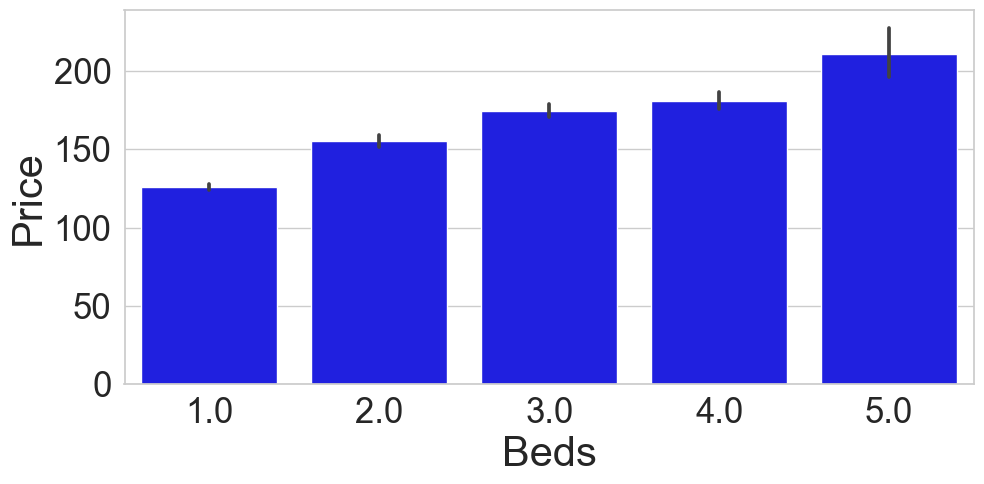

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

# Showing the distribution between price and the number of bedrooms
figsize = (10, 5)
x = 'beds'

# Create a grid with 1 row and 1 column
fig = plt.figure(figsize=figsize)
gs = GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1, color='blue')
ax1.set_xlabel('Beds', fontsize=30)  # Increase font size of x-axis label
ax1.set_ylabel('Price', fontsize=30)  # Increase font size of x-axis label
plt.xticks(fontsize=25)  # Increase font size of x-axis ticks
plt.yticks(fontsize=25)

# Calculate the percentage of each bedroom count relative to all listings
beds_percentage = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for beds, percentage in beds_percentage.items():
    print(f'The percentage of listings with {beds} bed(s) is: {percentage:.2f}%')

plt.tight_layout()
plt.show()

The percentage of listings with 1.0 bathrooms(s) is: 40.64%
The percentage of listings with 2.0 bathrooms(s) is: 33.51%
The percentage of listings with 3.0 bathrooms(s) is: 15.42%
The percentage of listings with 4.0 bathrooms(s) is: 7.75%
The percentage of listings with 5.0 bathrooms(s) is: 2.68%


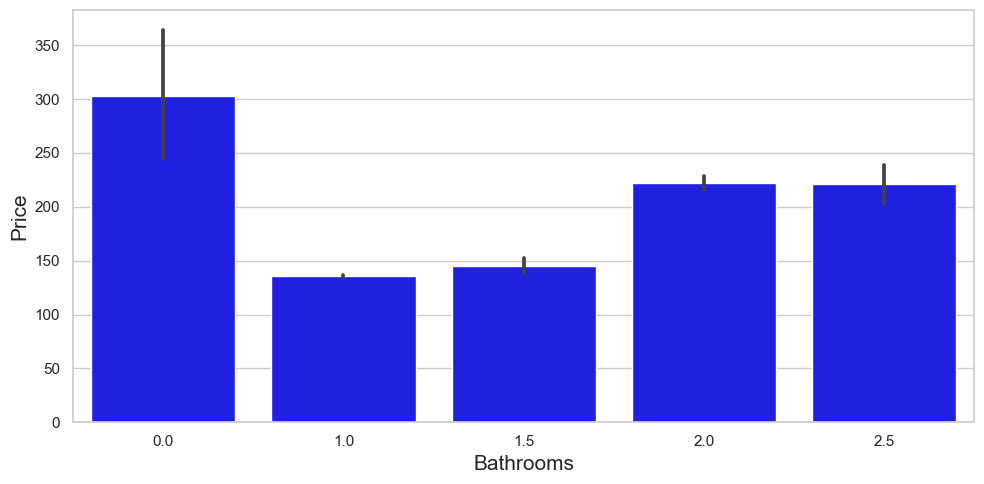

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

# Showing the distribution between price and the number of bedrooms
figsize = (10, 5)
x = 'bathrooms'

# Create a grid with 1 row and 1 column
fig = plt.figure(figsize=figsize)
gs = GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1, color='blue')
ax1.set_xlabel('Bathrooms', fontsize=15)  # Increase font size of x-axis label
ax1.set_ylabel('Price', fontsize=15)  # Increase font size of x-axis label


# Calculate the percentage of each bedroom count relative to all listings
c = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for bathrooms, percentage in beds_percentage.items():
    print(f'The percentage of listings with {bathrooms} bathrooms(s) is: {percentage:.2f}%')

plt.tight_layout()
plt.show()

The percentage of listings with 2 accommodates is: 35.28%
The percentage of listings with 4 accommodates is: 27.62%
The percentage of listings with 3 accommodates is: 14.22%
The percentage of listings with 5 accommodates is: 8.17%
The percentage of listings with 6 accommodates is: 7.56%
The percentage of listings with 1 accommodates is: 4.40%
The percentage of listings with 7 accommodates is: 1.57%
The percentage of listings with 8 accommodates is: 0.91%
The percentage of listings with 9 accommodates is: 0.20%
The percentage of listings with 10 accommodates is: 0.08%


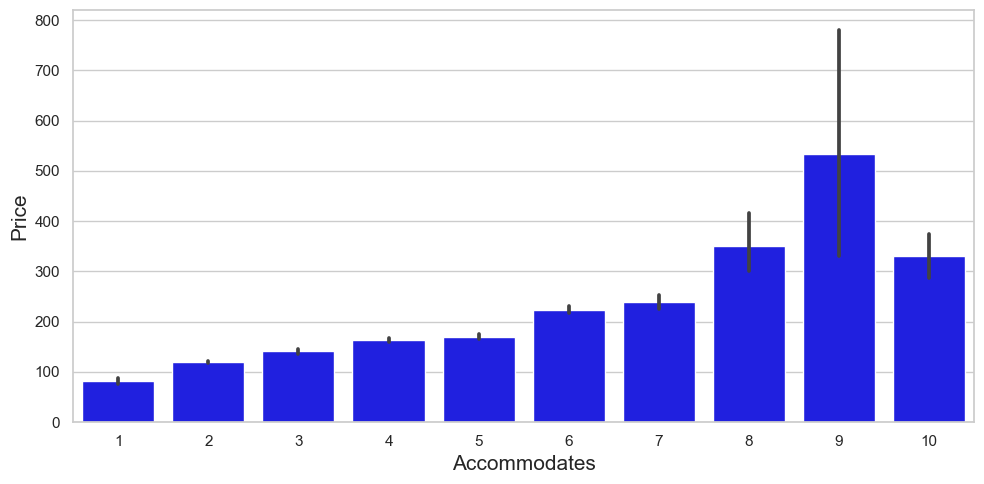

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

# Showing the distribution between price and the number of bedrooms
figsize = (10, 5)
x = 'accommodates'

# Create a grid with 1 row and 1 column
fig = plt.figure(figsize=figsize)
gs = GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1, color='blue')
ax1.set_xlabel('Accommodates', fontsize=15)  # Increase font size of x-axis label
ax1.set_ylabel('Price', fontsize=15)  # Increase font size of x-axis label


# Calculate the percentage of each bedroom count relative to all listings
accommodates_percentage = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for accommodates, percentage in accommodates_percentage.items():
    print(f'The percentage of listings with {accommodates} accommodates is: {percentage:.2f}%')

plt.tight_layout()
plt.show()

The percentage of listings with 24 total amenities is: 3.56%
The percentage of listings with 27 total amenities is: 3.41%
The percentage of listings with 21 total amenities is: 3.36%
The percentage of listings with 30 total amenities is: 3.34%
The percentage of listings with 28 total amenities is: 3.31%
The percentage of listings with 25 total amenities is: 3.30%
The percentage of listings with 22 total amenities is: 3.28%
The percentage of listings with 26 total amenities is: 3.26%
The percentage of listings with 29 total amenities is: 3.19%
The percentage of listings with 23 total amenities is: 3.05%
The percentage of listings with 19 total amenities is: 3.03%
The percentage of listings with 14 total amenities is: 2.99%
The percentage of listings with 32 total amenities is: 2.98%
The percentage of listings with 13 total amenities is: 2.94%
The percentage of listings with 16 total amenities is: 2.89%
The percentage of listings with 12 total amenities is: 2.88%
The percentage of listin

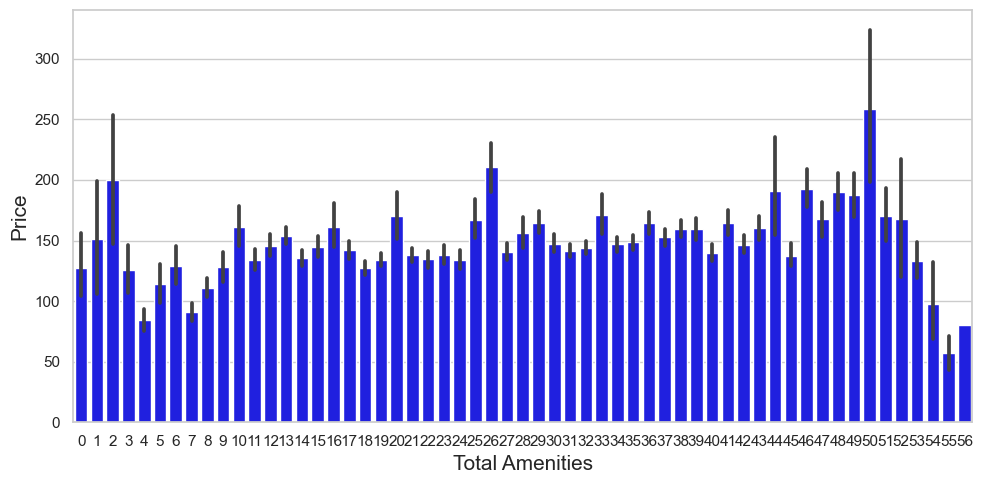

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec

# Showing the distribution between price and the number of bedrooms
figsize = (10, 5)
x = 'total_amenities'

# Create a grid with 1 row and 1 column
fig = plt.figure(figsize=figsize)
gs = GridSpec(1, 1)

# Bar plot for price distribution
ax1 = plt.subplot(gs[0])
sns.barplot(data=dataframe1, x=x, y='price', ax=ax1, color='blue')
ax1.set_xlabel('Total Amenities', fontsize=15)  # Increase font size of x-axis label
ax1.set_ylabel('Price', fontsize=15)  # Increase font size of x-axis label


# Calculate the percentage of each bedroom count relative to all listings
total_amenities_percentage = dataframe1[x].value_counts(normalize=True) * 100

# Display the percentage of each bedroom count
for total_amenities, percentage in total_amenities_percentage.items():
    print(f'The percentage of listings with {total_amenities} total amenities is: {percentage:.2f}%')

plt.tight_layout()
plt.show()

## Price variation across property types

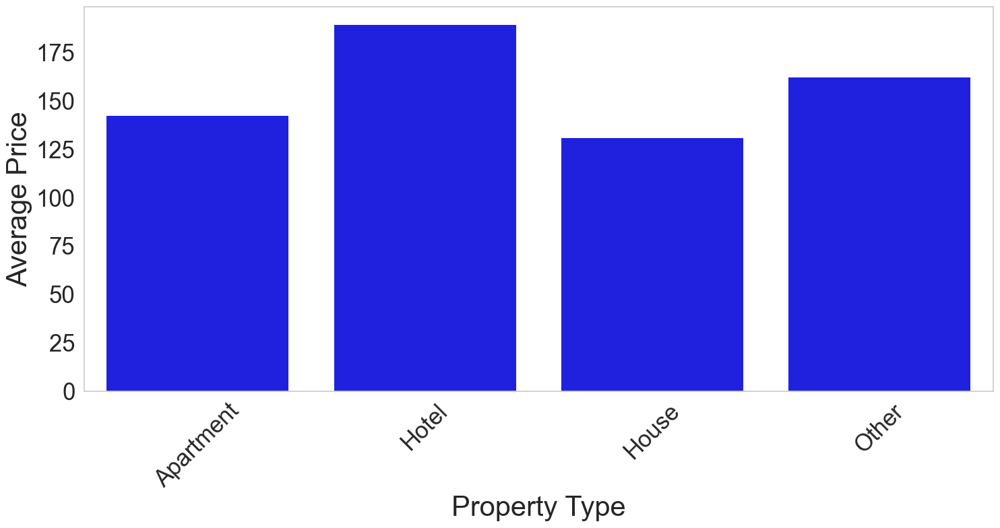

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define the figure size
figsize = (15, 8)

# Identify columns that start with "property_type"
property_type_columns = [col for col in dataframe1.columns if col.startswith('property_type')]

# Calculate the average price for each property type
average_prices = []

for col in property_type_columns:
    # Calculate the average price where the property type is True
    avg_price = dataframe1.loc[dataframe1[col] == True, 'price'].mean()
    average_prices.append(avg_price)

# Strip 'property_type_' prefix from property type column names
property_type_labels = [col.replace('property_type_', '') for col in property_type_columns]

# Combine the average prices into a DataFrame for plotting
price_df = pd.DataFrame({
    'Property Type': property_type_labels,
    'Average Price': average_prices
})

# Plotting
plt.figure(figsize=figsize)

# Plot the average price for each property type
sns.barplot(x='Property Type', y='Average Price', data=price_df, color='blue', edgecolor='none')

plt.ylabel('Average Price', fontsize=30)  # Increase font size of y-axis label
plt.xlabel('Property Type', fontsize=30)  # Increase font size of x-axis label
plt.xticks(rotation=45, fontsize=25)  # Increase font size of x-axis ticks
plt.yticks(fontsize=25)  # Increase font size of y-axis ticks
plt.grid(False)  # Disable grid lines

plt.tight_layout()
plt.show()

## Reviews scores per neighborhood

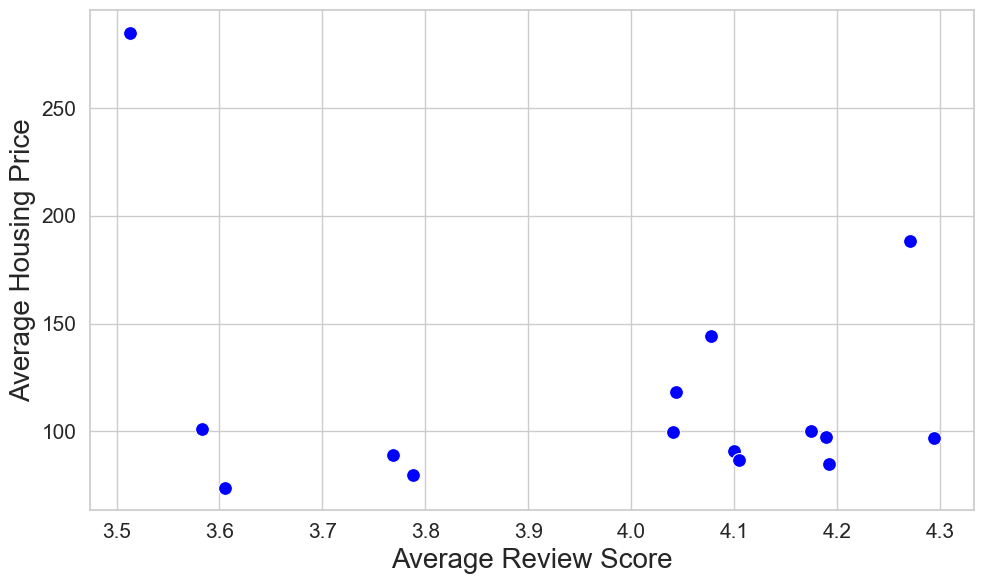

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'dataframe1' contains 'price', 'review_scores_rating', and 'neighbourhood'
dataframe1['review_scores_rating'] = pd.to_numeric(dataframe1['review_scores_rating'], errors='coerce')  # Convert to numeric if not already

# Group by 'neighbourhood' and calculate the mean price and mean review score
neighbourhood_stats = dataframe1.groupby('neighbourhood').agg({
    'price': 'mean',
    'review_scores_rating': 'mean'
}).reset_index()

# Drop any rows with NaN values that may interfere with visualization
neighbourhood_stats.dropna(inplace=True)

# Plotting
plt.figure(figsize=(10, 6))
sns.scatterplot(x='review_scores_rating', y='price', data=neighbourhood_stats, color='blue', s=100)

# Adjust the size of the title and labels
plt.xlabel('Average Review Score', fontsize=20)
plt.ylabel('Average Housing Price', fontsize=20)
plt.xticks(fontsize=15)  # Increase font size of x-axis ticks
plt.yticks(fontsize=15)
plt.grid(True)

plt.tight_layout()
plt.show()

## Price variation per Airbnb

In [19]:
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
from matplotlib import cm, colors

# Sample data loading
# dataframe1 = pd.read_csv('path_to_your_data.csv')  # Assuming the dataset is read in as dataframe1

# Step 1: Aggregate the pricing information across all dates
# Assuming the dataset has 'id', 'latitude', 'longitude', and 'price' columns
aggregated_data = dataframe1.groupby(['id', 'latitude', 'longitude']).agg({'price': 'mean'}).reset_index()

# Step 2: Select a random date from the dataset
random_date = dataframe1['date'].sample(1).iloc[0]

# Step 3: Filter the dataset for the selected date
filtered_data = dataframe1[dataframe1['date'] == random_date]

# Step 4: Create a base map centered on Rome
map_rome = folium.Map(location=[41.9028, 12.4964], zoom_start=12)

# Step 5: Normalize the prices for color mapping using a logarithmic scale
aggregated_data['log_price'] = np.log1p(aggregated_data['price'])  # Apply log scale
min_price_log = aggregated_data['log_price'].min()
max_price_log = aggregated_data['log_price'].max()
norm = colors.Normalize(vmin=min_price_log, vmax=max_price_log)
colormap = cm.ScalarMappable(norm=norm, cmap='YlGnBu')

# Step 6: Add markers to the map with colors indicating price
for _, row in aggregated_data.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=colors.to_hex(colormap.to_rgba(row['log_price'])),
        fill=True,
        fill_color=colors.to_hex(colormap.to_rgba(row['log_price'])),
        fill_opacity=0.7,
        popup=f"ID: {row['id']}<br>Price: ${row['price']:.2f}"
    ).add_to(map_rome)

# Step 7: Add a color legend to the map
# Create a legend as an HTML string with precise color steps
color_scale_steps = np.linspace(min_price_log, max_price_log, 256)
color_scale_hex = [colors.to_hex(colormap.to_rgba(v)) for v in color_scale_steps]
color_scale_gradient = ', '.join(color_scale_hex)

legend_html = f"""
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 200px; height: 150px; 
            border:2px solid grey; z-index:9999; font-size:14px;
            background-color:white; padding: 10px;">
    <h4 style="margin-bottom:10px;">Price Legend ($)</h4>
    <div style="background:linear-gradient(to right, {color_scale_gradient});height:20px;width:100%;"></div>
    <div style="display:flex;justify-content:space-between;margin-top:5px;">
        <span>{np.expm1(min_price_log):.2f}</span><span>{np.expm1(max_price_log):.2f}</span>
    </div>
</div>
"""
map_rome.get_root().html.add_child(folium.Element(legend_html))

# Save map to HTML file
# map_rome.save('rome_airbnb_price_map.html')

# Display the map in a Jupyter notebook (optional, requires Jupyter environment)
map_rome